# Importing packages

In [123]:
import matplotlib
#matplotlib.use("TkAgg")
from scipy.io import wavfile
from scipy import signal
from scipy.signal import blackman
#from matplotlib import mlab
from matplotlib import pyplot as plt
import numpy as np
#from numpy.lib import stride_tricks
from pylab import *
from struct import pack
#import pywt
from scipy.fftpack import dct
#from struct import pack
import wave
from scipy.io import wavfile
import os
#import glob

import gc
import multiprocessing as mp
import resource 
import csv
import itertools

import pandas as pd
import ipywidgets as widgets

gc.enable()

flag = 0
date = '20210310'
dates = ['20210310','20210315','20210319','20210420','20210514']#,'20210714','20210715','20210716']
data_path = 'data/'
mono_path = data_path + "wav/"
stereo_path = data_path + "stereo/"

mono_file_path = mono_path + date + "/"
stereo_file_path = stereo_path + date + "/"

sweep_path = data_path + "sweep/"
sweep_time_path = sweep_path + date + "/"

aud_path = data_path + "aud_times/"
aud_time_path = aud_path + date + "/"

visual_path = 'visual/'

#print os.path.splitext("20171025/data/")[0]

In [124]:
from IPython.core.display import display, HTML 
display(HTML("<style>.container { width:75% !important; }</style>"))

%config IPCompleter.greedy=True

# Checking memory usage

In [125]:
def mem():
    print('Memory usage  : %2.2f MB' %round(resource.getrusage(resource.RUSAGE_SELF).ru_maxrss/1024.0,1))

In [126]:
from os import listdir
from os.path import isfile, join
onlyfiles=[]
for d in dates:
    print(d)
    mypath = "processed/" + "spectra/" + d + "/left"
    of = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    onlyfiles.extend(of)

20210310
20210315
20210319
20210420
20210514


In [127]:
onlyfiles.sort()

In [128]:
onlyfiles

['20210310_15:25:26.159-20210310_15:25:39.816',
 '20210310_15:25:48.350-20210310_15:25:58.158',
 '20210310_15:26:14.684-20210310_15:26:25.036',
 '20210310_15:26:36.351-20210310_15:26:45.720',
 '20210310_15:26:59.160-20210310_15:27:08.845',
 '20210310_15:27:20.548-20210310_15:27:30.566',
 '20210310_15:29:00.353-20210310_15:29:09.829',
 '20210310_15:29:25.107-20210310_15:29:34.689',
 '20210310_15:29:41.711-20210310_15:29:51.347',
 '20210310_15:30:04.369-20210310_15:30:13.898',
 '20210310_15:30:21.964-20210310_15:30:32.030',
 '20210310_15:30:50.167-20210310_15:31:01.015',
 '20210310_15:31:09.318-20210310_15:31:20.694',
 '20210310_15:31:57.174-20210310_15:32:07.006',
 '20210310_15:32:14.252-20210310_15:32:24.462',
 '20210310_15:32:32.730-20210310_15:32:42.915',
 '20210310_15:32:48.233-20210310_15:32:58.401',
 '20210310_15:33:58.721-20210310_15:34:08.178',
 '20210310_15:34:21.045-20210310_15:34:32.102',
 '20210310_15:34:48.696-20210310_15:34:57.898',
 '20210310_15:42:00.571-20210310_15:42:1

# Label the instances

imp_res = pd.DataFrame()
for f in onlyfiles:
    ir = pd.read_csv("processed/" + "ir_raw/" + date + "/left/" + f, index_col=False, header=None)
    #break
    if date == "20210218":
        if f in {'20210218_16:44:01.177-20210218_16:44:33.943','20210218_16:51:41.403-20210218_16:52:20.100','20210218_16:53:18.712-20210218_16:54:04.193'}:
            index = ['no']*len(ir)
        if f in {'20210218_16:57:18.254-20210218_16:58:03.582','20210218_17:00:26.185-20210218_17:01:01.872','20210218_17:01:08.542-20210218_17:01:43.332'}:
            index = ['up']*len(ir)
        if f in {'20210218_17:03:41.837-20210218_17:04:15.747','20210218_17:05:08.986-20210218_17:05:42.206','20210218_17:04:31.485-20210218_17:05:06.079'}:
            index = ['side']*len(ir)
            
    if date == "20210224":
        if f in {'20210224_17:55:21.433-20210224_17:55:55.191','20210224_17:56:04.294-20210224_17:56:39.426','20210224_17:57:00.457-20210224_17:57:34.537'}:
            index = ['up']*len(ir)
        if f in {'20210224_17:59:54.251-20210224_18:00:26.660','20210224_18:00:38.187-20210224_18:01:11.561','20210224_18:01:26.215-20210224_18:01:58.796'}:
            index = ['side']*len(ir)
        if f in {'20210224_18:06:50.537-20210224_18:07:23.479','20210224_18:08:00.368-20210224_18:08:33.322','20210224_18:08:37.805-20210224_18:09:11.272'}:
            index = ['no']*len(ir)
            
    if date == "20210302":
        if f in {'20210302_18:23:30.772-20210302_18:24:04.601','20210302_18:24:11.484-20210302_18:24:43.738','20210302_18:24:49.526-20210302_18:25:20.850'}:
            index = ['up']*len(ir)
        if f in {'20210302_18:32:33.332-20210302_18:33:05.962','20210302_18:33:12.699-20210302_18:33:44.740','20210302_18:33:51.921-20210302_18:34:24.773'}:
            index = ['side']*len(ir)
        if f in {'20210302_18:36:32.772-20210302_18:37:04.393','20210302_18:37:21.275-20210302_18:37:52.954','20210302_18:37:59.677-20210302_18:38:31.361'}:
            index = ['no']*len(ir)
        
    ir.index = index
    imp_res = pd.concat([imp_res, ir], axis=0)

# Leave-one-session-out CV

In [134]:
session_list = onlyfiles

session_list = ['20210302_18:23:30.772-20210302_18:24:04.601','20210302_18:24:11.484-20210302_18:24:43.738','20210302_18:24:49.526-20210302_18:25:20.850','20210302_18:32:33.332-20210302_18:33:05.962','20210302_18:33:12.699-20210302_18:33:44.740','20210302_18:33:51.921-20210302_18:34:24.773','20210302_18:36:32.772-20210302_18:37:04.393','20210302_18:37:21.275-20210302_18:37:52.954','20210302_18:37:59.677-20210302_18:38:31.361']

session_list = ['20210310_15:25:26.159-20210310_15:25:39.816',
 '20210310_15:25:48.350-20210310_15:25:58.158',
 '20210310_15:26:14.684-20210310_15:26:25.036',
 '20210310_15:26:36.351-20210310_15:26:45.720',
 '20210310_15:26:59.160-20210310_15:27:08.845',
 '20210310_15:27:20.548-20210310_15:27:30.566',
 '20210310_15:29:00.353-20210310_15:29:09.829',
 '20210310_15:29:25.107-20210310_15:29:34.689',
 '20210310_15:29:41.711-20210310_15:29:51.347',
 '20210310_15:30:04.369-20210310_15:30:13.898',
 '20210310_15:30:21.964-20210310_15:30:32.030',
 '20210310_15:30:50.167-20210310_15:31:01.015',
 '20210310_15:31:09.318-20210310_15:31:20.694',
 '20210310_15:31:57.174-20210310_15:32:07.006',
 '20210310_15:32:14.252-20210310_15:32:24.462',
 '20210310_15:32:32.730-20210310_15:32:42.915',
 '20210310_15:32:48.233-20210310_15:32:58.401',
 '20210310_15:33:58.721-20210310_15:34:08.178',
 '20210310_15:34:21.045-20210310_15:34:32.102',
 '20210310_15:34:48.696-20210310_15:34:57.898',
 '20210310_15:42:00.571-20210310_15:42:11.946',
 '20210310_15:42:19.717-20210310_15:42:31.077',
 '20210310_15:42:43.374-20210310_15:42:54.045',
 '20210310_15:43:03.762-20210310_15:43:16.249',
 '20210310_15:44:04.924-20210310_15:44:15.189',
 '20210310_15:45:59.889-20210310_15:46:12.812',
 '20210310_15:46:20.984-20210310_15:46:32.410',
 '20210310_15:47:27.823-20210310_15:47:37.342',
 '20210310_15:49:41.258-20210310_15:49:51.348',
 '20210310_15:50:03.345-20210310_15:50:15.186',
 '20210310_15:50:19.873-20210310_15:50:29.207',
 '20210310_15:51:04.495-20210310_15:51:14.504',
 '20210310_15:51:22.201-20210310_15:51:34.120',
 '20210310_15:51:45.847-20210310_15:51:55.083',
 '20210310_15:52:00.814-20210310_15:52:11.246',
 '20210310_15:52:24.012-20210310_15:52:34.588',
 '20210310_15:52:48.777-20210310_15:52:58.321',
 '20210310_15:54:24.829-20210310_15:54:36.180',
 '20210310_15:58:17.102-20210310_15:58:34.089',
 '20210315_17:05:24.467-20210315_17:05:35.463',
 '20210315_17:05:51.089-20210315_17:06:00.494',
 '20210315_17:06:18.458-20210315_17:06:28.282',
 '20210315_17:07:11.513-20210315_17:07:20.684',
 '20210315_17:07:38.925-20210315_17:07:48.142',
 '20210315_17:08:00.532-20210315_17:08:09.611',
 '20210315_17:08:39.633-20210315_17:08:48.837',
 '20210315_17:09:10.210-20210315_17:09:20.081',
 '20210315_17:09:47.785-20210315_17:09:56.866',
 '20210315_17:10:08.695-20210315_17:10:18.533',
 '20210315_17:10:40.285-20210315_17:10:49.683',
 '20210315_17:11:54.379-20210315_17:12:04.246',
 '20210315_17:12:13.407-20210315_17:12:23.341',
 '20210315_17:13:29.822-20210315_17:13:40.619',
 '20210315_17:17:00.289-20210315_17:17:10.236',
 '20210315_17:19:31.337-20210315_17:19:40.940',
 '20210315_17:20:38.369-20210315_17:20:48.298',
 '20210315_17:21:29.553-20210315_17:21:39.505',
 '20210315_17:21:47.752-20210315_17:21:57.917',
 '20210315_17:23:00.273-20210315_17:23:09.830']

def label_data(f, ir):

    if date == "20210218":
        if f in {'20210218_16:44:01.177-20210218_16:44:33.943','20210218_16:51:41.403-20210218_16:52:20.100','20210218_16:53:18.712-20210218_16:54:04.193'}:
            index = ['no']*len(ir)
        if f in {'20210218_16:57:18.254-20210218_16:58:03.582','20210218_17:00:26.185-20210218_17:01:01.872','20210218_17:01:08.542-20210218_17:01:43.332'}:
            index = ['up']*len(ir)
        if f in {'20210218_17:03:41.837-20210218_17:04:15.747','20210218_17:05:08.986-20210218_17:05:42.206','20210218_17:04:31.485-20210218_17:05:06.079'}:
            index = ['side']*len(ir)
            
    if date == "20210224":
        if f in {'20210224_17:55:21.433-20210224_17:55:55.191','20210224_17:56:04.294-20210224_17:56:39.426','20210224_17:57:00.457-20210224_17:57:34.537'}:
            index = ['up']*len(ir)
        if f in {'20210224_17:59:54.251-20210224_18:00:26.660','20210224_18:00:38.187-20210224_18:01:11.561','20210224_18:01:26.215-20210224_18:01:58.796'}:
            index = ['side']*len(ir)
        if f in {'20210224_18:06:50.537-20210224_18:07:23.479','20210224_18:08:00.368-20210224_18:08:33.322','20210224_18:08:37.805-20210224_18:09:11.272'}:
            index = ['no']*len(ir)
            
    if date == "20210302":
        if f in {'20210302_18:23:30.772-20210302_18:24:04.601','20210302_18:24:11.484-20210302_18:24:43.738','20210302_18:24:49.526-20210302_18:25:20.850'}:
            index = ['up']*len(ir)
        if f in {'20210302_18:32:33.332-20210302_18:33:05.962','20210302_18:33:12.699-20210302_18:33:44.740','20210302_18:33:51.921-20210302_18:34:24.773'}:
            index = ['side']*len(ir)
        if f in {'20210302_18:36:32.772-20210302_18:37:04.393','20210302_18:37:21.275-20210302_18:37:52.954','20210302_18:37:59.677-20210302_18:38:31.361'}:
            index = ['no']*len(ir)
     
    ir.index = index
    return ir

In [135]:
from sklearn.ensemble import RandomForestClassifier
def randomForest(train, train_labels):
    # Create the model with 100 trees
    model = RandomForestClassifier(n_estimators=100, criterion="entropy",
                                   max_features = 'sqrt')
    # Fit on training data
    model.fit(train, train_labels)
    #pickle.dump(model, open(root + str(test_env) + "/training_phase/" + "randomForest.sav", 'wb'))
    return model 

In [136]:
def random_undersampling(mots):
    print ("Undersampling..")
    all_mots = pd.DataFrame()
    tr = mots
    labels = mots.index.values.reshape(-1)
    feature_num = np.unique(labels, return_counts=True)
    #print(feature_num)
    min_feature_num = min(feature_num[1])
    #print(min_feature_num)
    feature_num = np.stack(feature_num, axis=1) # label of each cluster and number of instances
    for x in feature_num:
        #print(x)
        #try:
        delete_itr = len(mots.loc[mots.index == x[0]]) - min_feature_num
        #print(delete_itr)
        label_loc = train_data.loc[mots.index == x[0]]
        randoms = label_loc.sample(len(label_loc) - delete_itr)
        #display(randoms)
        all_mots = pd.concat([all_mots,randoms],axis=0)
        #display(all_mots) 
    return all_mots

In [137]:
def extract_mfcc_feat(imp_res):
    sample_rate = 192000
    lbp_set = pd.DataFrame()
    mfcc_set = pd.DataFrame()
    for index, row in imp_res.iterrows():
        signal = np.array(row)
        #formants = get_formants(signal)
        mfcc = calc_mfcc(sample_rate,signal)
        mfcc_set = pd.concat([mfcc_set,pd.DataFrame(mfcc.flatten()).T],axis=0)
        #lbp = lbp_feat_calc(mfcc)
        #lbp_set = pd.concat([lbp_set,lbp], axis=0)
        #formant_set = pd.concat([formant_set, formants,axis=0])
    #lbp_set.index = imp_res.index
    mfcc_set.index = imp_res.index
    return mfcc_set

In [138]:
def extract_spectral_feat(imp_res):
    spectrum_set = pd.DataFrame()
    for index, row in imp_res.iterrows():
        signal = np.array(row)
        f = calculate_spectrum(signal)
        spectrum_set = pd.concat([spectrum_set, f],axis=0)

    spectrum_set.index = imp_res.index
    return spectrum_set

In [139]:
session_list

['20210310_15:25:26.159-20210310_15:25:39.816',
 '20210310_15:25:48.350-20210310_15:25:58.158',
 '20210310_15:26:14.684-20210310_15:26:25.036',
 '20210310_15:26:36.351-20210310_15:26:45.720',
 '20210310_15:26:59.160-20210310_15:27:08.845',
 '20210310_15:27:20.548-20210310_15:27:30.566',
 '20210310_15:29:00.353-20210310_15:29:09.829',
 '20210310_15:29:25.107-20210310_15:29:34.689',
 '20210310_15:29:41.711-20210310_15:29:51.347',
 '20210310_15:30:04.369-20210310_15:30:13.898',
 '20210310_15:30:21.964-20210310_15:30:32.030',
 '20210310_15:30:50.167-20210310_15:31:01.015',
 '20210310_15:31:09.318-20210310_15:31:20.694',
 '20210310_15:31:57.174-20210310_15:32:07.006',
 '20210310_15:32:14.252-20210310_15:32:24.462',
 '20210310_15:32:32.730-20210310_15:32:42.915',
 '20210310_15:32:48.233-20210310_15:32:58.401',
 '20210310_15:33:58.721-20210310_15:34:08.178',
 '20210310_15:34:21.045-20210310_15:34:32.102',
 '20210310_15:34:48.696-20210310_15:34:57.898',
 '20210310_15:42:00.571-20210310_15:42:1

In [140]:
def make_data(data_set):
    X = data_set
    y = data_set.index
    
    return X,y

In [141]:
def label_data(f, ir,date):
    ir = ir
    imp_res = pd.DataFrame()
    #print(date)
    #for f in onlyfiles:
    #ir = pd.read_csv("processed/" + "mfcc/" + date + "/left/" + f, index_col=False, header=None)
    if date == '20210310':
        #print(datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f'))
        if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210310_15:25:26_159",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210310_15:34:57_898",'%Y%m%d_%H:%M:%S_%f'):
            index = ['tree']*len(ir)
            #print("tree")
        elif datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210310_15:42:00_571",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210310_15:58:34_089",'%Y%m%d_%H:%M:%S_%f'):
            index = ['car']*len(ir)
            #print("car")
    elif date == '20210315':
        if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210315_17:05:24_467",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210315_17:23:09_830",'%Y%m%d_%H:%M:%S_%f'):
            index = ['wall']*len(ir)
    #print(np.unique(index,return_counts = True))
    elif date == '20210319':
        if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210319_13:05:24_467",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210319_18:23:09_830",'%Y%m%d_%H:%M:%S_%f'):
            index = ['signpost']*len(ir)
            
    elif date == '20210420':
        if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210420_17:52:47_117",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210420_18:23:56_440",'%Y%m%d_%H:%M:%S_%f'):
            index = ['bush']*len(ir)
            
    elif date == '20210514':
        if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210514_17:59:24_508",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210514_18:26:00_351",'%Y%m%d_%H:%M:%S_%f'):
            index = ['bike']*len(ir)
            
#     elif date == '20210714':
#         if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210714_16:10:55_699",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210714_19:19:04_118",'%Y%m%d_%H:%M:%S_%f'):
#             index = ['tree']*len(ir)
            
#     elif date == '20210715':
#         if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210715_12:10:55_699",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210715_16:19:04_118",'%Y%m%d_%H:%M:%S_%f'):
#             index = ['tree']*len(ir)
            
#     elif date == '20210716':
#         if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210716_16:06:20_028",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210716_16:06:45_480",'%Y%m%d_%H:%M:%S_%f'):
#             index = ['tree']*len(ir)
            
#         if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210716_16:10:36_500",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210716_16:15:45_480",'%Y%m%d_%H:%M:%S_%f'):
#             index = ['wall']*len(ir)
            
#         if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210716_16:19:40_500",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210716_16:23:50_480",'%Y%m%d_%H:%M:%S_%f'):
#             index = ['signpost']*len(ir)
            
#         if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210716_16:24:50_500",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210716_16:27:50_480",'%Y%m%d_%H:%M:%S_%f'):
#             index = ['bush']*len(ir)
            
#         if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210716_16:30:00_500",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210716_16:32:04_480",'%Y%m%d_%H:%M:%S_%f'):
#             index = ['car']*len(ir)
            
#         if datetime.datetime.strptime(f.split("-")[0],'%Y%m%d_%H:%M:%S.%f') >= datetime.datetime.strptime("20210716_16:38:20_000",'%Y%m%d_%H:%M:%S_%f') and datetime.datetime.strptime(f.split("-")[1],'%Y%m%d_%H:%M:%S.%f') <= datetime.datetime.strptime("20210716_16:40:20_480",'%Y%m%d_%H:%M:%S_%f'):
#             index = ['bike']*len(ir)    
            
    ir.index = index
        
    return ir

In [110]:
'20210716_16:07:00.916-20210716_16:07:10.222'

'20210716_16:07:00.916-20210716_16:07:10.222'

In [142]:
from sklearn.svm import OneClassSVM 
def one_class_svm(training_data):
    #temp = pd.concat([training_data,testing_data])
    training_len = len(training_data)
    #training_data.index = training_labels[1]
    
    #display(training_data.head())
    #display(testing_data.head())
    
    labels = training_data.index#[1].values.reshape(-1)
    feature_num = np.unique(labels, return_counts=True)
    locs = feature_num[0]
    data = pd.DataFrame()
    for l in locs:
        #display(training_data.loc[training_data.index == l].head())
        print ("training svm....", l)
        svm = OneClassSVM(kernel='rbf', gamma=0.000001)
        svm.fit(training_data.loc[training_data.index == l])
        print ("outlier predicting...", l) 
        #display(testing_data.loc[testing_data.index == l])
        #try:
        out_l = svm.predict(training_data.loc[training_data.index == l])
        print (out_l)
        #print (np.unique(out_l, return_counts=True))
        out_l = pd.DataFrame(out_l,columns = ['out_l']) 
        out_l.index = training_data.loc[training_data.index == l].index

        out = pd.concat([out_l,training_data.loc[training_data.index == l]],axis=1)
        data = pd.concat([data,out])
        data = data[data.out_l != 1]
        data.drop(["out_l"],axis=1,inplace=True)
        
    #data.drop(data['out_l']==-1,axis=0,inplace=True)
    return data

In [143]:
from sklearn.decomposition import PCA
def pca_calc(training_data, testing_data):
    #display(all_acc)
    # Concat with keys
    train_labels = training_data.index
    test_labels = test_data.index
    temp = pd.concat([training_data,testing_data])
    training_len = len(training_data)
    testing_len = len(testing_data)
    # Selecting data from multi index 
    
    
    #temp = np.array(temp)

    pca = PCA(n_components=300)
    acc_w = pca.fit_transform(temp)
    #display(acc_w)
    train = pd.DataFrame(acc_w[0:training_len])
    test = pd.DataFrame(acc_w[training_len:])
    #train,test = temp.xs(0),temp.xs(1)    
    train.index = train_labels
    test.index = test_labels
    return train,test

import torch.nn as nn
import torch
import torchvision
import torchvision.transforms as transforms
class DACNN(nn.Module):
    def __init__(self):
        super().__init__()
        
        #Add more convolution layers and make the input to the FC small
        self.feature_extractor = nn.Sequential(
           nn.Conv1d(1, 6, 3, stride=1),
           nn.MaxPool1d(2,2),nn.ReLU(True),
          nn.Conv1d(6, 16, 3, stride=1),
           nn.MaxPool1d(2,2),nn.ReLU(True),  
          #nn.Conv1d(16, 8, 10, stride=1),
          # nn.MaxPool1d(2,2), nn.ReLU(True),
          #  nn.Conv1d(20, 10, 3, stride=2),
          # nn.MaxPool1d(2,2), nn.ReLU(True)
        )
        
        self.num_cnn_features = 720#352
        self.class_classifier = nn.Sequential(
           #nn.Linear(self.num_cnn_features, 120), 
           #nn.Dropout(), nn.ReLU(True),
         #nn.Linear(self.num_cnn_features, 80), nn.BatchNorm1d(80),nn.ReLU(True),
            nn.Linear(self.num_cnn_features, 20),nn.BatchNorm1d(20),nn.LeakyReLU(True),
        #nn.Linear(120, 84),nn.BatchNorm1d(84), nn.LeakyReLU(True),
          nn.Linear(20, 4), nn.LeakyReLU(True),
        )
        
#         self.domain_classifier = nn.Sequential(
#            nn.Linear(self.num_cnn_features, 120),
#            nn.ReLU(True),
#           nn.Linear(120, 2),
#           nn.LogSoftmax(dim=1),
#         )
        
    def forward(self, x):
        #features = x
        features = self.feature_extractor(x)
        #print(features.size())
        features = features.view(4,-1)
        #print(features.size())
        #features_grl = GradientReversalFn.apply(features, grl_lambda)
        class_pred = self.class_classifier(features) #classify on regular features
        #domain_pred = self.domain_classifier(features_grl) #classify on features after GRL
        return class_pred

model = DACNN()
device = torch.device('cuda:1')
model = model.to(device)

model

def func(epoch):
    if epoch < 80:
        return 1.0
    elif epoch < 110:
        return 0.8#0.5**2
    elif epoch < 130:
        return 0.5#0.5**3
    elif epoch < 140:
        return 0.1#0.5**3   
    else:
        return 0.05#0.5**4

import torch.optim as optim

lr = 0.001
n_epochs = 150

#Setup optimizer
#class_optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)
#disc_optimizer = optim.SGD(model.parameters(), lr=0.00001, momentum=0.9)
class_optimizer = optim.Adam(model.parameters())

#Separate loss functions for classifier and discriminator
#weights = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.1, 1.0] #20200706
#class_weights = torch.FloatTensor(weights)
loss_fn_class = nn.CrossEntropyLoss()#weight=class_weights.to(device))

#loss_fn_domain = nn.CrossEntropyLoss()
#class_scheduler = torch.optim.lr_scheduler.LambdaLR(class_optimizer, lr_lambda = func)#lambda epoch: 0.95 ** epoch)
#disc_scheduler = torch.optim.lr_scheduler.LambdaLR(disc_optimizer, lr_lambda = func)

import torch.utils.data as data_utils

batch_size = 4
def make_test_dataloader(targets,data):
    torch_labels = torch.tensor(targets)
    torch_data = torch.tensor(data.values)
    dataset = data_utils.TensorDataset(torch_data,torch_labels)
    #trainset = torch.stack([torch_training_data,torch_training_labels])
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,shuffle = False, drop_last=False,num_workers=2)
    return dataloader

def make_train_dataloader(targets,data):
    torch_labels = torch.tensor(targets)
    torch_data = torch.tensor(data.values)
    dataset = data_utils.TensorDataset(torch_data,torch_labels)
    #trainset = torch.stack([torch_training_data,torch_training_labels])
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,shuffle=True, drop_last=True,num_workers=2)
    return dataloader

from sklearn import preprocessing
#def prep_data(X_train, y_train, X_test, y_test):
label_encoder = preprocessing.LabelEncoder()
training_targets = label_encoder.fit_transform(y_train)

#Read testing data
#testing_timestamps,testing_labels,testing_data = read_test_data(test_list)

#Encode
testing_targets = label_encoder.transform(y_test)

#Make training dataloader
train_dataloader = make_train_dataloader(training_targets, X_train)

#Make test dataloader
test_dataloader = make_test_dataloader(testing_targets, X_test)

#return train_dataloader, test_dataloader

#train_dataloader, test_dataloader = prep_data(X_train, y_train, X_test, y_test)

def plot_cm(confusion_matrix,classes):
    import seaborn as sns
    plt.figure(figsize=(10,8))
    ax= plt.subplot()
    #sns.heatmap(confusion_matrix/confusion_matrix.sum(0), annot=True, ax = ax, cmap = "Greys", vmin=0, vmax=1)
    y_axis_labels = classes
    x_axis_labels = classes
    sns.heatmap(confusion_matrix, annot=True, fmt = 'g', ax = ax, cmap = "Greys", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
    #sns.heatmap(confusion_matrix, annot=True, fmt='g', ax = ax, cmap = "Greys")
    plt.show()

#### model = DACNN()
device = torch.device('cuda:1')
model = model.to(device)

batch_size = batch_size
#max_batches = min(len(train_dataloader),len(test_dataloader))
sdl = []
tdl = []
cl = []
running_corrects = 0.0
total = 0.0
train_running_corrects = 0.0
train_running_loss = 0.0
train_total = 0.0
loss_per_epoch = 0.0
val_losses = []
val_accuracies = []
train_losses = []
train_accuracies = []
learning_rate = []

correct = 0
total = 0
running_loss=0



for epoch_idx in range(n_epochs):
    
    nb_classes = 4
    confusion_matrix = torch.zeros(nb_classes, nb_classes)
    
    class_scheduler.step()
    learning_rate.append(class_scheduler.get_lr())
    
    #print (envs[0])
    cpred = []
    lbl = []
    print(f'Epoch {epoch_idx+1:04d} / {n_epochs:04d}', end='\n=====================================\n')
    dl_source_iter = iter(train_dataloader)
    dl_target_iter = iter(test_dataloader)
    model.train()
    for batch_idx in range(len(train_dataloader)):#range(len(train_dataloader)):#range(max_batches):
        X_s, y_s = next(dl_source_iter)
        class_pred = model(X_s.unsqueeze(1).float().to(device))
        _, c_pred = torch.max(class_pred, 1)
        c_pred.to(device)
        #c_pred[c_pred==7] = -1
        train_running_corrects += torch.sum(c_pred == y_s.to(device)).item()
        train_total += y_s.size(0)
        
        loss_s_label = loss_fn_class(class_pred, y_s.to(device))
        train_running_loss += loss_s_label.item()
        class_optimizer.zero_grad()
        loss_s_label.backward(retain_graph=True)
        class_optimizer.step()
        
        if batch_idx%10 == 9:
            print(f'[{batch_idx+1}/{batch_size}] '
                  f'class_loss: {loss_s_label.item():.4f} '
             )
        p = c_pred.cpu().tolist()
        cpred.extend(p)
        l = y_s.cpu().tolist()
        lbl.extend(l)
        
        total += y_s.size(0)
        correct += (c_pred == y_s.to(device)).sum().item()
        
        running_loss += loss_s_label.item()
        
        for t, p in zip(y_s.view(-1), c_pred.view(-1)):
            confusion_matrix[t.long(), p.long()] += 1
            
        class_optimizer.zero_grad()
        loss_s_label.backward(retain_graph=True)
        class_optimizer.step()
        
    lbl = label_encoder.inverse_transform(lbl)
    cpred = label_encoder.inverse_transform(cpred)
    class_report = (classification_report(lbl, cpred))
    print(class_report)
    
    train_epochs_acc = train_running_corrects / train_total
    train_epochs_loss = train_running_loss / (len(train_dataloader)*(epoch_idx+1))
    print("Learning_rate = ",class_scheduler.get_lr())
    print ("Training accuracy =", train_epochs_acc)
    print ("Training loss =", train_epochs_loss)
    
    print('Accuracy of the network: %d %%' % (
        100 * correct / total))
    
    epoch_loss = running_loss / len(test_dataloader)
    epochs_acc = running_corrects / total
    val_losses.append(epoch_loss)
    val_accuracies.append(epochs_acc)
    train_losses.append(train_epochs_loss)
    train_accuracies.append(train_epochs_acc)
    #plot_cm(confusion_matrix,label_encoder.classes_)

model.train(False)
model.eval()
test_cpred = []
test_lbl = []
with torch.no_grad():
    for data in test_dataloader:
        seg, labels = data
        outputs = model(seg.unsqueeze(1).float().to(device))
        _, predicted = torch.max(outputs, 1)
        loss = loss_fn_class(outputs.to(device), labels.to(device))

        for t, p in zip(labels.view(-1), predicted.view(-1)):
            confusion_matrix[t.long(), p.long()] += 1

        total += labels.size(0)
        correct += (predicted == labels.to(device)).sum().item()

        running_loss += loss.item()
        #Remove "other" from the accuracy

        p = predicted.cpu().tolist()
        test_cpred.extend(p)
        l = labels.cpu().tolist()
        test_lbl.extend(l)
        #break
        #predicted[predicted==le.transform(["other"])[0]] = -1
        running_corrects += torch.sum(predicted == labels.to(device)).item()
        
    test_lbl = label_encoder.inverse_transform(test_lbl)
    test_cpred = label_encoder.inverse_transform(test_cpred)
    class_report = (classification_report(test_lbl, test_cpred))
    print(class_report)


torch.max(outputs,1)

outputs[0].data

#plt.ylabel("loss")
#plt.xlabel("epoch")
plt.plot(train_accuracies)
#plt.plot(val_losses)

plt.plot(train_losses)

plot_cm(confusion_matrix,label_encoder.classes_)

In [144]:
def diff_calc(df_slize):
    df_diff = df_slize.diff(axis=1)
    df_diff.dropna(inplace=True,axis=1)
    #norm_diff = df_diff / df_diff.max(axis=1).values
    norm_diff = df_diff.divide(df_diff.max(axis=1).values, axis=0)
    return norm_diff

In [114]:
diff_calc(test_data)

,1,2,3,4,5,6,7,8,9,10,...,364,365,366,367,368,369,370,371,372,373
bike,0.399972,0.228543,-0.206210,-0.030897,-1.183176,-0.357330,0.999668,0.436877,-0.782273,0.317492,...,0.397137,0.148249,-0.524524,0.122170,0.394469,0.152820,-0.052882,-0.257842,-0.083117,-0.050245
bike,0.502628,0.474507,0.129592,-0.273743,-0.714746,-0.619748,0.993138,0.635992,-0.669782,-0.274703,...,0.596013,0.190718,-0.660387,-0.010125,0.678584,-0.099080,-0.183421,-0.031202,-0.198024,-0.002738
bike,0.262279,0.286090,-0.040836,0.098785,-0.797829,-0.154010,0.898813,0.681668,-0.240221,0.019502,...,0.568925,-0.102693,-0.495380,0.218563,0.494910,-0.115429,-0.186592,-0.185478,-0.064812,-0.017939
bike,0.322414,0.453940,0.538543,0.408474,-0.015990,-0.142115,0.358309,0.258049,-0.131148,0.057847,...,0.442484,-0.042667,-0.405156,0.298979,0.309175,-0.142380,-0.111265,-0.134049,-0.068631,-0.032485
bike,0.099412,0.066046,0.225640,-0.054537,-0.348022,0.244181,0.944728,0.380102,-0.466521,0.297630,...,0.990913,-0.090614,-0.865421,0.297903,0.685098,0.015773,-0.335720,-0.281418,-0.123208,-0.001825
bike,0.002270,-0.002030,-0.026509,0.142455,-0.763560,-0.570541,0.746876,0.854216,0.057030,0.033920,...,0.415199,0.028368,-0.469672,0.161164,0.604759,-0.067322,-0.197630,-0.217885,-0.100759,-0.035289
bike,0.303620,0.314060,-0.038510,-0.114999,-0.302241,-0.152633,0.549269,0.221956,-0.095528,0.203601,...,0.731432,-0.332916,-0.422052,0.187793,0.456202,-0.031356,-0.172401,-0.189015,-0.076151,-0.020041
bike,0.417204,0.241681,0.195236,-0.595016,-0.976810,-0.511592,0.527880,0.128405,-0.352668,0.600648,...,0.673408,-0.127205,-0.492375,0.178805,0.589386,-0.174174,-0.199758,-0.180099,0.027387,-0.091066


In [145]:
def read_data(dates,session):
    data = pd.DataFrame()
    for date in dates:
        #print(session[:8])
        #print(date)
        if date == session[:8]:
            #print(session)
            #feature1 = pd.read_csv("processed/" + "spectra/" + date + "/right/" + session, index_col=False, header=None)
            #feature2 = pd.read_csv("processed/" + "spectra/" + date + "/left/" + session, index_col=False, header=None)
            feature3 =pd.read_csv("processed/" + "mfccs/" + date + "/right/" + session, index_col=False, header=None)
            feature4 = pd.read_csv("processed/" + "mfccs/" + date + "/left/" + session, index_col=False, header=None)
            
            #feature1.dropna(axis=0,inplace=True)
            #feature2.dropna(axis=0,inplace=True)
            feature3.dropna(axis=0,inplace=True)
            feature4.dropna(axis=0,inplace=True)
            
            #feature5 = diff_calc(feature1)
            #feature6 = diff_calc(feature2)
            #display(feature1.head())
            #display(feature3.head())
            #display(feature5.head())

            data = pd.concat([feature3,feature4],axis=1,ignore_index=True)
        
            
            #data = feature1
            #data.dropna(inplace=True,axis=0)
            data = label_data(session,data,date)
            #print(np.unique(data.index))
        #except:print("")#data = pd.DataFrame()
    #print(len(data.T))    
    return data

In [146]:
from collections import Counter
def majority_vote(y_pred):
    #print(y_pred)
#     delete_list = []
#     c = 0
#     for p in prob:
#         if p.max() < 0.5:
#             delete_list.append(c)
#         c = c + 1
#     y_pred = np.delete(y_pred,delete_list)
#     if y_pred.size > 0:
    maj = Counter(y_pred).most_common(1)[0][0]
#     else: return []
    return maj 

In [147]:
def weighted_majority_vote(y_pred,prob):
    delete_list = []
    c = 0
    gini = gini_calc(prob)
    for g in gini:
        if g > 0.5:
            delete_list.append(c)
        c = c + 1
    temp_y_pred = np.delete(y_pred,delete_list)
    if temp_y_pred.size > 0:
        maj = Counter(temp_y_pred).most_common(1)[0][0]
    else: return majority_vote(y_pred)
    return maj 

In [148]:
def gini_calc(prob):
    gini = []
    for p in prob:
        gini.append(1-np.sum(p**2))
    return gini

In [149]:
from imblearn.over_sampling import RandomOverSampler,SMOTE
def SMOTE_oversampling(training_data,training_labels):
    #training_labels = all_mots[[1]]
    #all_mots.drop([0],axis=1,inplace=True)
    #all_mots.drop([1],axis=1,inplace=True)
    #training_data = all_mots 
    ros = SMOTE(sampling_strategy={'car':300,'signpost':300,'tree':300,'wall':300},random_state=0)
    X_resampled, y_resampled = ros.fit_resample(training_data, training_labels)
    return X_resampled, y_resampled

In [150]:
session_list

['20210310_15:25:26.159-20210310_15:25:39.816',
 '20210310_15:25:48.350-20210310_15:25:58.158',
 '20210310_15:26:14.684-20210310_15:26:25.036',
 '20210310_15:26:36.351-20210310_15:26:45.720',
 '20210310_15:26:59.160-20210310_15:27:08.845',
 '20210310_15:27:20.548-20210310_15:27:30.566',
 '20210310_15:29:00.353-20210310_15:29:09.829',
 '20210310_15:29:25.107-20210310_15:29:34.689',
 '20210310_15:29:41.711-20210310_15:29:51.347',
 '20210310_15:30:04.369-20210310_15:30:13.898',
 '20210310_15:30:21.964-20210310_15:30:32.030',
 '20210310_15:30:50.167-20210310_15:31:01.015',
 '20210310_15:31:09.318-20210310_15:31:20.694',
 '20210310_15:31:57.174-20210310_15:32:07.006',
 '20210310_15:32:14.252-20210310_15:32:24.462',
 '20210310_15:32:32.730-20210310_15:32:42.915',
 '20210310_15:32:48.233-20210310_15:32:58.401',
 '20210310_15:33:58.721-20210310_15:34:08.178',
 '20210310_15:34:21.045-20210310_15:34:32.102',
 '20210310_15:34:48.696-20210310_15:34:57.898',
 '20210310_15:42:00.571-20210310_15:42:1

In [105]:
import pickle
# save the model to disk
filename = 'finalized_model.sav'
pickle.dump(model, open(filename, 'wb'))

In [49]:
# test_list = ['20210714_16:10:55.699-20210714_16:11:05.303',
#  '20210714_16:11:30.487-20210714_16:11:39.786',
#  '20210714_16:12:16.001-20210714_16:12:25.656',
#  '20210714_16:12:32.956-20210714_16:12:43.484']

#test_list = [ '20210714_17:39:49.436-20210714_17:39:58.645',
# '20210714_17:40:06.722-20210714_17:40:15.847',
# '20210714_17:40:34.440-20210714_17:40:43.397']

# test_list = [ '20210714_19:18:11.508-20210714_19:18:21.950',
#  '20210714_19:18:28.308-20210714_19:18:39.222',
#  '20210714_19:18:53.776-20210714_19:19:04.118']

#test_list = ['20210715_14:49:39.620-20210715_14:49:48.199']
#,'20210715_14:49:56.087-20210715_14:50:05.656','20210715_14:50:12.748-20210715_14:50:22.734']

test_list = ['20210716_16:06:35.244-20210716_16:06:45.480',
 '20210716_16:39:35.305-20210716_16:39:45.414',
 '20210716_16:39:21.234-20210716_16:39:30.418',
 '20210716_16:30:38.435-20210716_16:30:47.217',
 '20210716_16:25:56.013-20210716_16:26:06.308',
 '20210716_16:38:20.209-20210716_16:38:29.269',
 '20210716_16:26:36.532-20210716_16:26:47.121',
 '20210716_16:14:30.367-20210716_16:14:40.214',
 '20210716_16:23:26.513-20210716_16:23:35.474',
 '20210716_16:27:35.194-20210716_16:27:44.251',
 '20210716_16:30:55.034-20210716_16:31:04.932',
 '20210716_16:31:53.898-20210716_16:32:03.072',
 '20210716_16:21:15.433-20210716_16:21:25.016',
 '20210716_16:25:37.200-20210716_16:25:46.646',
 '20210716_16:40:11.071-20210716_16:40:19.873',
 '20210716_16:10:36.628-20210716_16:10:46.535',
 '20210716_16:22:36.590-20210716_16:22:46.132',
 '20210716_16:30:20.512-20210716_16:30:30.037',
 '20210716_16:19:40.679-20210716_16:19:49.423',
 '20210716_16:11:34.841-20210716_16:11:43.947',
 '20210716_16:06:20.028-20210716_16:06:29.466',
 '20210716_16:38:54.141-20210716_16:39:03.383',
 '20210716_16:26:13.568-20210716_16:26:23.824',
 '20210716_16:24:54.564-20210716_16:25:04.206',
 '20210716_16:12:33.067-20210716_16:12:43.044',
 '20210716_16:21:46.892-20210716_16:21:55.907',
 '20210716_16:30:00.980-20210716_16:30:11.036',
 '20210716_16:13:35.624-20210716_16:13:45.087']


test_list = ['20210716_16:06:35.244-20210716_16:06:45.480',
 '20210716_16:39:35.305-20210716_16:39:45.414',
 '20210716_16:39:21.234-20210716_16:39:30.418',
 '20210716_16:30:38.435-20210716_16:30:47.217',
 '20210716_16:25:56.013-20210716_16:26:06.308',
 '20210716_16:38:20.209-20210716_16:38:29.269',
 '20210716_16:26:36.532-20210716_16:26:47.121',
 '20210716_16:07:00.916-20210716_16:07:10.222',
 '20210716_16:14:30.367-20210716_16:14:40.214',
 '20210716_16:23:26.513-20210716_16:23:35.474',
 '20210716_16:27:35.194-20210716_16:27:44.251',
 '20210716_16:30:55.034-20210716_16:31:04.932',
 '20210716_16:31:53.898-20210716_16:32:03.072',
 '20210716_16:21:15.433-20210716_16:21:25.016',
 '20210716_16:25:37.200-20210716_16:25:46.646',
 '20210716_16:40:11.071-20210716_16:40:19.873',
 '20210716_16:10:36.628-20210716_16:10:46.535',
 '20210716_16:08:02.936-20210716_16:08:12.093',
 '20210716_16:22:36.590-20210716_16:22:46.132',
 '20210716_16:08:24.103-20210716_16:08:33.900',
 '20210716_16:30:20.512-20210716_16:30:30.037',
 '20210716_16:19:40.679-20210716_16:19:49.423',
 '20210716_16:11:34.841-20210716_16:11:43.947',
 '20210716_16:06:20.028-20210716_16:06:29.466',
 '20210716_16:38:54.141-20210716_16:39:03.383',
 '20210716_16:26:13.568-20210716_16:26:23.824',
 '20210716_16:24:54.564-20210716_16:25:04.206',
 '20210716_16:12:33.067-20210716_16:12:43.044',
 '20210716_16:21:46.892-20210716_16:21:55.907',
 '20210716_16:30:00.980-20210716_16:30:11.036',
 '20210716_16:13:35.624-20210716_16:13:45.087']

In [50]:
test_list.sort()

In [51]:
test_list

['20210716_16:06:20.028-20210716_16:06:29.466',
 '20210716_16:06:35.244-20210716_16:06:45.480',
 '20210716_16:10:36.628-20210716_16:10:46.535',
 '20210716_16:11:34.841-20210716_16:11:43.947',
 '20210716_16:12:33.067-20210716_16:12:43.044',
 '20210716_16:13:35.624-20210716_16:13:45.087',
 '20210716_16:14:30.367-20210716_16:14:40.214',
 '20210716_16:19:40.679-20210716_16:19:49.423',
 '20210716_16:21:15.433-20210716_16:21:25.016',
 '20210716_16:21:46.892-20210716_16:21:55.907',
 '20210716_16:22:36.590-20210716_16:22:46.132',
 '20210716_16:23:26.513-20210716_16:23:35.474',
 '20210716_16:24:54.564-20210716_16:25:04.206',
 '20210716_16:25:37.200-20210716_16:25:46.646',
 '20210716_16:25:56.013-20210716_16:26:06.308',
 '20210716_16:26:13.568-20210716_16:26:23.824',
 '20210716_16:26:36.532-20210716_16:26:47.121',
 '20210716_16:27:35.194-20210716_16:27:44.251',
 '20210716_16:30:00.980-20210716_16:30:11.036',
 '20210716_16:30:20.512-20210716_16:30:30.037',
 '20210716_16:30:38.435-20210716_16:30:4

In [52]:
session_list[session_list!=test_list]

'20210310_15:25:48.350-20210310_15:25:58.158'

In [53]:
[x for x in session_list if x != test_list]

['20210310_15:25:26.159-20210310_15:25:39.816',
 '20210310_15:25:48.350-20210310_15:25:58.158',
 '20210310_15:26:14.684-20210310_15:26:25.036',
 '20210310_15:26:36.351-20210310_15:26:45.720',
 '20210310_15:26:59.160-20210310_15:27:08.845',
 '20210310_15:27:20.548-20210310_15:27:30.566',
 '20210310_15:29:00.353-20210310_15:29:09.829',
 '20210310_15:29:25.107-20210310_15:29:34.689',
 '20210310_15:29:41.711-20210310_15:29:51.347',
 '20210310_15:30:04.369-20210310_15:30:13.898',
 '20210310_15:30:21.964-20210310_15:30:32.030',
 '20210310_15:30:50.167-20210310_15:31:01.015',
 '20210310_15:31:09.318-20210310_15:31:20.694',
 '20210310_15:31:57.174-20210310_15:32:07.006',
 '20210310_15:32:14.252-20210310_15:32:24.462',
 '20210310_15:32:32.730-20210310_15:32:42.915',
 '20210310_15:32:48.233-20210310_15:32:58.401',
 '20210310_15:33:58.721-20210310_15:34:08.178',
 '20210310_15:34:21.045-20210310_15:34:32.102',
 '20210310_15:34:48.696-20210310_15:34:57.898',
 '20210310_15:42:00.571-20210310_15:42:1

In [54]:
from sklearn.metrics import confusion_matrix, classification_report
#dates = ["20210315"]
predicted_labels = []
true_labels = []
pred_prob = []
maj_pre_lab =[]
maj_true_lab = []
w_maj_pre_lab = []
w_maj_true_lab = []

for session in test_list:

    #test_data = pd.concat(pd.read_csv("processed/" + "spectrum/" + date + "/right/" + session, index_col=False, header=None))

    
    #display(test_data.head)
    print("Test session = ", session)
    #try:
    test_data = read_data(dates,session)
    test_data.dropna(inplace=True, axis=0)
    #test_data = one_class_svm(test_data)
    #test_data = pd.concat(diff_calc(test_data.iloc[:,0:94]))
    train_list = [x for x in session_list if x != session]
    train_data = pd.DataFrame()
    count = 0
    for ts in train_list:
        print("|" + "*"*(count+1) + ' '*(len(train_list)-1-count)+ "| " +str(format((count+1)/len(train_list)*100,'.3f')) + "% is complete..." ,end="\r")
        #tr = pd.read_csv("processed/" + "spectrum/" + date + "/right/" + ts, index_col=False, header=None)
#         tr_feature1 = pd.read_csv("processed/" + "spectrum/" + date + "/right/" + ts, index_col=False, header=None)
#         tr_feature2 = pd.read_csv("processed/" + "spectrum/" + date + "/left/" + ts, index_col=False, header=None)
#         tr_feature3 =pd.read_csv("processed/" + "mfcc/" + date + "/right/" + ts, index_col=False, header=None)
#         tr_feature4 = pd.read_csv("processed/" + "mfcc/" + date + "/left/" + ts, index_col=False, header=None)
#         tr = pd.concat([tr_feature1,tr_feature2,tr_feature3,tr_feature4],axis=1)
#         tr = label_data(ts,tr)
        try:
            tr = read_data(dates, ts)
            train_data = pd.concat([train_data,tr],axis=0,ignore_index=False)
        except: 
            #print('error')
            continue
        count = count+1
    #except: continue
        #break
    #print(np.unique(train_data.index, return_counts=True))
    #train_data = random_undersampling(train_data)
    #print(np.unique(train_data.index, return_counts=True))
    train_data.dropna(inplace=True, axis=0)
    #train_data = diff_calc(train_data.iloc[:,0:94])
    #train_data = one_class_svm(train_data)
    #train_data, test_data = pca_calc(train_data,test_data)
    test_feat = test_data#extract_mfcc_feat(test_data)
    train_feat = train_data#extract_mfcc_feat(train_data)
    test_feat.dropna(axis=0,inplace=True)
    train_feat.dropna(axis=0,inplace=True)
    X_train, y_train = make_data(train_feat)
    X_test, y_test = make_data(test_feat)
    
    
    
    #Smote oversampling
#    X_train,y_train = SMOTE_oversampling(X_train,y_train)
    #break
    # Load the Model back from file
    #with open('finalized_model.sav', 'rb') as file:  
    #    model = pickle.load(file)
    model = randomForest(X_train, y_train.tolist())
    y_pred = model.predict(X_test)
    prob = model.predict_proba(X_test)
    
    maj_pre_lab.append(majority_vote(y_pred))
    maj_true_lab.append(majority_vote(y_test))
    
    w_maj_pre_lab.append(weighted_majority_vote(y_pred, prob))
    w_maj_true_lab.append(weighted_majority_vote(y_test, prob))
    
    if y_test.all() == "car":
        pred_prob.append(["car",prob[:,0].tolist()])
    elif y_test.all() == "signpost":
        pred_prob.append(["signpost",prob[:,1].tolist()])
    elif y_test.all() == "tree":
        pred_prob.append(["tree",prob[:,2].tolist()])
    elif y_test.all() == "wall":
        pred_prob.append(["wall",prob[:,3].tolist()])
    elif y_test.all() == "bush":
        pred_prob.append(["bush",prob[:,4].tolist()])
    elif y_test.all() == "bike":
        pred_prob.append(["bike",prob[:,5].tolist()])
    conf_mat = confusion_matrix(y_test, y_pred)
    class_report = classification_report(y_test, y_pred)
    print("\n")
    print(conf_mat)
    print(class_report)
    predicted_labels.extend(y_pred)
    true_labels.extend(y_test)
    #break
print("Overall results...")   
print(confusion_matrix(true_labels, predicted_labels))
print(classification_report(true_labels, predicted_labels))

print("Majority vote results...")
print(confusion_matrix(maj_true_lab, maj_pre_lab))
print(classification_report(maj_true_lab, maj_pre_lab))

print("Weighted majority vote results...")
print(confusion_matrix(w_maj_true_lab, w_maj_pre_lab))
print(classification_report(w_maj_true_lab, w_maj_pre_lab))

Test session =  20210716_16:06:20.028-20210716_16:06:29.466


NameError: name 'feature1' is not defined

In [ ]:
all_test = pd.DataFrame()
for session in test_list:
    test_data = read_data(dates,session)
    all_test = pd.concat([all_test,test_data],axis=0)

In [ ]:
all_test

In [ ]:
test_data

In [170]:
dates

['20210310', '20210315', '20210319', '20210420', '20210514', '20210714']

In [225]:
t=[]
for d in dates:
    print(d)
    mypath = "processed/" + "spectra/" + d + "/left"
    of = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    t.extend(of)

20210310
20210315
20210319
20210420
20210514
20210714
20210715
20210716


In [226]:
t

['20210310_15:42:19.717-20210310_15:42:31.077',
 '20210310_15:51:22.201-20210310_15:51:34.120',
 '20210310_15:25:48.350-20210310_15:25:58.158',
 '20210310_15:46:20.984-20210310_15:46:32.410',
 '20210310_15:57:57.180-20210310_15:58:08.059',
 '20210310_15:45:59.889-20210310_15:46:12.812',
 '20210310_15:32:14.252-20210310_15:32:24.462',
 '20210310_15:54:24.829-20210310_15:54:36.180',
 '20210310_15:52:00.814-20210310_15:52:11.246',
 '20210310_15:51:04.495-20210310_15:51:14.504',
 '20210310_15:51:45.847-20210310_15:51:55.083',
 '20210310_15:27:20.548-20210310_15:27:30.566',
 '20210310_15:30:04.369-20210310_15:30:13.898',
 '20210310_15:25:26.159-20210310_15:25:39.816',
 '20210310_15:30:50.167-20210310_15:31:01.015',
 '20210310_15:43:03.762-20210310_15:43:16.249',
 '20210310_15:26:59.160-20210310_15:27:08.845',
 '20210310_15:58:17.102-20210310_15:58:34.089',
 '20210310_15:42:00.571-20210310_15:42:11.946',
 '20210310_15:49:41.258-20210310_15:49:51.348',
 '20210310_15:34:21.045-20210310_15:34:3

In [151]:
from sklearn.metrics import confusion_matrix, classification_report
#dates = ["20210315"]
predicted_labels = []
true_labels = []
pred_prob = []
maj_pre_lab =[]
maj_true_lab = []
w_maj_pre_lab = []
w_maj_true_lab = []

for session in session_list:

    #test_data = pd.concat(pd.read_csv("processed/" + "spectrum/" + date + "/right/" + session, index_col=False, header=None))

    
    #display(test_data.head)
    print("Test session = ", session)
    try:
        test_data = read_data(dates,session)
        test_data.dropna(inplace=True, axis=0)
        #test_data = one_class_svm(test_data)
        #test_data = pd.concat(diff_calc(test_data.iloc[:,0:94]))
        train_list = [x for x in session_list if x != session]
        train_data = pd.DataFrame()
        count = 0
        for ts in train_list:
            print("|" + "*"*(count+1) + ' '*(len(train_list)-1-count)+ "| " +str(format((count+1)/len(train_list)*100,'.3f')) + "% is complete..." ,end="\r")
            #tr = pd.read_csv("processed/" + "spectrum/" + date + "/right/" + ts, index_col=False, header=None)
    #         tr_feature1 = pd.read_csv("processed/" + "spectrum/" + date + "/right/" + ts, index_col=False, header=None)
    #         tr_feature2 = pd.read_csv("processed/" + "spectrum/" + date + "/left/" + ts, index_col=False, header=None)
    #         tr_feature3 =pd.read_csv("processed/" + "mfcc/" + date + "/right/" + ts, index_col=False, header=None)
    #         tr_feature4 = pd.read_csv("processed/" + "mfcc/" + date + "/left/" + ts, index_col=False, header=None)
    #         tr = pd.concat([tr_feature1,tr_feature2,tr_feature3,tr_feature4],axis=1)
    #         tr = label_data(ts,tr)
            try:
                tr = read_data(dates, ts)
                train_data = pd.concat([train_data,tr],axis=0,ignore_index=False)
            except: 
                continue
            count = count+1
    except: 
        continue
        #break
    #print(np.unique(train_data.index, return_counts=True))
    #train_data = random_undersampling(train_data)
    #print(np.unique(train_data.index, return_counts=True))
    train_data.dropna(inplace=True, axis=0)
    #train_data = diff_calc(train_data.iloc[:,0:94])
    #train_data = one_class_svm(train_data)
    #train_data, test_data = pca_calc(train_data,test_data)
    test_feat = test_data#extract_mfcc_feat(test_data)
    train_feat = train_data#extract_mfcc_feat(train_data)
    test_feat.dropna(axis=0,inplace=True)
    train_feat.dropna(axis=0,inplace=True)
    X_train, y_train = make_data(train_feat)
    X_test, y_test = make_data(test_feat)
    
    
    
    #Smote oversampling
#    X_train,y_train = SMOTE_oversampling(X_train,y_train)
    #break
    model = randomForest(X_train, y_train.tolist())
    y_pred = model.predict(X_test)
    prob = model.predict_proba(X_test)
    
    maj_pre_lab.append(majority_vote(y_pred))
    maj_true_lab.append(majority_vote(y_test))
    
    w_maj_pre_lab.append(weighted_majority_vote(y_pred, prob))
    w_maj_true_lab.append(weighted_majority_vote(y_test, prob))
    
    if y_test.all() == "car":
        pred_prob.append(["car",prob[:,0].tolist()])
    elif y_test.all() == "signpost":
        pred_prob.append(["signpost",prob[:,1].tolist()])
    elif y_test.all() == "tree":
        pred_prob.append(["tree",prob[:,2].tolist()])
    elif y_test.all() == "wall":
        pred_prob.append(["wall",prob[:,3].tolist()])
    elif y_test.all() == "bush":
        pred_prob.append(["bush",prob[:,4].tolist()])
    elif y_test.all() == "bike":
        pred_prob.append(["bike",prob[:,5].tolist()])
    conf_mat = confusion_matrix(y_test, y_pred)
    class_report = classification_report(y_test, y_pred)
    print("\n")
    print(conf_mat)
    print(class_report)
    predicted_labels.extend(y_pred)
    true_labels.extend(y_test)
    #break
print("Overall results...")   
print(confusion_matrix(true_labels, predicted_labels))
print(classification_report(true_labels, predicted_labels))

print("Majority vote results...")
print(confusion_matrix(maj_true_lab, maj_pre_lab))
print(classification_report(maj_true_lab, maj_pre_lab))

print("Weighted majority vote results...")
print(confusion_matrix(w_maj_true_lab, w_maj_pre_lab))
print(classification_report(w_maj_true_lab, w_maj_pre_lab))

Test session =  20210310_15:25:26.159-20210310_15:25:39.816


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [3 5]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        tree       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210310_15:25:48.350-20210310_15:25:58.158
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        tree       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:26:14.684-20210310_15:26:25.036


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [4 0 4]
 [0 0 0]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00       0.0
        tree       0.00      0.00      0.00       8.0
        wall       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:26:36.351-20210310_15:26:45.720


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [4 2 2]
 [0 0 0]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        tree       1.00      0.25      0.40         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.25         8
   macro avg       0.33      0.08      0.13         8
weighted avg       1.00      0.25      0.40         8

Test session =  20210310_15:26:59.160-20210310_15:27:08.845


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        tree       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:27:20.548-20210310_15:27:30.566


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:29:00.353-20210310_15:29:09.829
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        tree       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:29:25.107-20210310_15:29:34.689


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:29:41.711-20210310_15:29:51.347


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [1 2 5]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.25      0.40         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.25         8
   macro avg       0.33      0.08      0.13         8
weighted avg       1.00      0.25      0.40         8

Test session =  20210310_15:30:04.369-20210310_15:30:13.898


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:30:21.964-20210310_15:30:32.030


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 8]
 [0 0]]
              precision    recall  f1-score   support

        tree       0.00      0.00      0.00       8.0
        wall       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:30:50.167-20210310_15:31:01.015


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:31:09.318-20210310_15:31:20.694


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:31:57.174-20210310_15:32:07.006


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [4 4]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.50      0.67         8

    accuracy                           0.50         8
   macro avg       0.50      0.25      0.33         8
weighted avg       1.00      0.50      0.67         8

Test session =  20210310_15:32:14.252-20210310_15:32:24.462


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:32:32.730-20210310_15:32:42.915


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [1 2 5]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.25      0.40         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.25         8
   macro avg       0.33      0.08      0.13         8
weighted avg       1.00      0.25      0.40         8

Test session =  20210310_15:32:48.233-20210310_15:32:58.401


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [2 4 2]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.50      0.67         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.50         8
   macro avg       0.33      0.17      0.22         8
weighted avg       1.00      0.50      0.67         8

Test session =  20210310_15:33:58.721-20210310_15:34:08.178


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [4 4]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.50      0.67         8

    accuracy                           0.50         8
   macro avg       0.50      0.25      0.33         8
weighted avg       1.00      0.50      0.67         8

Test session =  20210310_15:34:21.045-20210310_15:34:32.102


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:34:48.696-20210310_15:34:57.898


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [3 0 5]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00       0.0
        tree       0.00      0.00      0.00       8.0
        wall       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:42:00.571-20210310_15:42:11.946


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[5 3]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.62      0.77         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210310_15:42:19.717-20210310_15:42:31.077


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 2]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.75      0.86         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:42:43.374-20210310_15:42:54.045
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

         car       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:43:03.762-20210310_15:43:16.249
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 2]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.75      0.86         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:45:59.889-20210310_15:46:12.812


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 1]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.86      0.92         7
        wall       0.00      0.00      0.00         0

    accuracy                           0.86         7
   macro avg       0.50      0.43      0.46         7
weighted avg       1.00      0.86      0.92         7

Test session =  20210310_15:46:20.984-20210310_15:46:32.410


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 8]
 [0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00       8.0
        wall       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:47:27.823-20210310_15:47:37.342


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[3 5]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.38      0.55         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.38         8
   macro avg       0.50      0.19      0.27         8
weighted avg       1.00      0.38      0.55         8

Test session =  20210310_15:49:41.258-20210310_15:49:51.348
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

         car       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:50:03.345-20210310_15:50:15.186


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 2]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.75      0.86         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:50:19.873-20210310_15:50:29.207


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 2]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.75      0.86         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:51:04.495-20210310_15:51:14.504


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.88      0.93         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:51:22.201-20210310_15:51:34.120


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 8]
 [0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00       8.0
        wall       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:51:45.847-20210310_15:51:55.083


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[4 4]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.50      0.67         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.50         8
   macro avg       0.50      0.25      0.33         8
weighted avg       1.00      0.50      0.67         8

Test session =  20210310_15:52:00.814-20210310_15:52:11.246


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.88      0.93         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:52:24.012-20210310_15:52:34.588


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[5 3]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.62      0.77         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210310_15:52:48.777-20210310_15:52:58.321


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[2 6]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.25      0.40         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.25         8
   macro avg       0.50      0.12      0.20         8
weighted avg       1.00      0.25      0.40         8

Test session =  20210310_15:54:24.829-20210310_15:54:36.180


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[5 3]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.62      0.77         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210310_15:57:57.180-20210310_15:58:08.059


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 6]]
              precision    recall  f1-score   support

        bush       0.00      0.00      0.00         0
         car       1.00      0.86      0.92         7

    accuracy                           0.86         7
   macro avg       0.50      0.43      0.46         7
weighted avg       1.00      0.86      0.92         7

Test session =  20210310_15:58:17.102-20210310_15:58:34.089


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [8 0]]
              precision    recall  f1-score   support

        bush       0.00      0.00      0.00       0.0
         car       0.00      0.00      0.00       8.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210315_17:05:24.467-20210315_17:05:35.463


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [7 1]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.12      0.22         8

    accuracy                           0.12         8
   macro avg       0.50      0.06      0.11         8
weighted avg       1.00      0.12      0.22         8

Test session =  20210315_17:05:51.089-20210315_17:06:00.494


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [0 0 0]
 [1 6 1]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
    signpost       0.00      0.00      0.00         0
        wall       1.00      0.12      0.22         8

    accuracy                           0.12         8
   macro avg       0.33      0.04      0.07         8
weighted avg       1.00      0.12      0.22         8

Test session =  20210315_17:06:18.458-20210315_17:06:28.282


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [0 0 0]
 [1 7 0]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00       0.0
    signpost       0.00      0.00      0.00       0.0
        wall       0.00      0.00      0.00       8.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210315_17:07:11.513-20210315_17:07:20.684


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [7 1]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.12      0.22         8

    accuracy                           0.12         8
   macro avg       0.50      0.06      0.11         8
weighted avg       1.00      0.12      0.22         8

Test session =  20210315_17:07:38.925-20210315_17:07:48.142


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210315_17:08:00.532-20210315_17:08:09.611


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [5 3]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.38      0.55         8

    accuracy                           0.38         8
   macro avg       0.50      0.19      0.27         8
weighted avg       1.00      0.38      0.55         8

Test session =  20210315_17:08:39.633-20210315_17:08:48.837
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        wall       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210315_17:09:10.210-20210315_17:09:20.081
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        wall       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210315_17:11:54.379-20210315_17:12:04.246


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [3 5]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        wall       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210315_17:12:13.407-20210315_17:12:23.341


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        wall       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210315_17:13:29.822-20210315_17:13:40.619
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        wall       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210315_17:17:00.289-20210315_17:17:10.236


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        wall       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210315_17:19:31.337-20210315_17:19:40.940
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        wall       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210315_17:20:38.369-20210315_17:20:48.298


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210315_17:21:29.553-20210315_17:21:39.505
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        wall       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210315_17:21:47.752-20210315_17:21:57.917


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        wall       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210315_17:23:00.273-20210315_17:23:09.830


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [0 0 0]
 [1 1 6]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        tree       0.00      0.00      0.00         0
        wall       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.33      0.25      0.29         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210319_16:08:41.692-20210319_16:08:51.649
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:10:10.704-20210319_16:10:21.506


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [0 0 0]
 [1 2 5]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       0.00      0.00      0.00         0
    signpost       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.33      0.21      0.26         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210319_16:10:32.051-20210319_16:10:42.621


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 1 1]
 [0 0 0]
 [0 0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.75      0.86         8
        tree       0.00      0.00      0.00         0
        wall       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.33      0.25      0.29         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210319_16:11:12.300-20210319_16:11:24.827


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[4 4]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.50      0.67         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.50         8
   macro avg       0.50      0.25      0.33         8
weighted avg       1.00      0.50      0.67         8

Test session =  20210319_16:12:04.601-20210319_16:12:13.752
Test session =  20210319_16:13:09.655-20210319_16:13:20.391
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:14:28.970-20210319_16:14:38.999


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.88      0.93         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210319_16:14:50.583-20210319_16:15:00.821


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[1 7]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.12      0.22         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.12         8
   macro avg       0.50      0.06      0.11         8
weighted avg       1.00      0.12      0.22         8

Test session =  20210319_16:15:18.712-20210319_16:15:29.511


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [3 1 4]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
    signpost       1.00      0.12      0.22         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.12         8
   macro avg       0.33      0.04      0.07         8
weighted avg       1.00      0.12      0.22         8

Test session =  20210319_16:15:55.217-20210319_16:16:06.432


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [2 0 6]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00       0.0
    signpost       0.00      0.00      0.00       8.0
        tree       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210319_16:16:17.283-20210319_16:16:28.357
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:16:47.785-20210319_16:16:57.626
|***************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [0 0 0]
 [2 1 5]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       0.00      0.00      0.00         0
    signpost       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.33      0.21      0.26         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210319_16:17:45.271-20210319_16:17:57.477


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.88      0.93         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210319_16:18:28.688-20210319_16:18:39.650


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.88      0.93         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210319_16:19:24.958-20210319_16:19:34.607


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.88      0.93         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210319_16:21:29.421-20210319_16:21:39.386
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:21:59.598-20210319_16:22:09.200
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[5 3]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.62      0.77         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210319_16:26:08.675-20210319_16:26:18.199
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:26:51.249-20210319_16:27:02.576
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 6]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.86      0.92         7

    accuracy                           0.86         7
   macro avg       0.50      0.43      0.46         7
weighted avg       1.00      0.86      0.92         7

Test session =  20210420_17:54:20.593-20210420_17:54:29.911


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [3 5]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210420_17:55:04.917-20210420_17:55:14.919
|*************************************************************************************************************************  | 98.374% is complete...

[[7]]
              precision    recall  f1-score   support

        bush       1.00      1.00      1.00         7

    accuracy                           1.00         7
   macro avg       1.00      1.00      1.00         7
weighted avg       1.00      1.00      1.00         7

Test session =  20210420_18:00:58.257-20210420_18:01:08.812


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[ 0  0]
 [10  6]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.38      0.55        16

    accuracy                           0.38        16
   macro avg       0.50      0.19      0.27        16
weighted avg       1.00      0.38      0.55        16

Test session =  20210420_18:01:53.576-20210420_18:01:56.215
Test session =  20210420_18:05:32.837-20210420_18:05:42.716


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [4 4]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.50      0.67         8

    accuracy                           0.50         8
   macro avg       0.50      0.25      0.33         8
weighted avg       1.00      0.50      0.67         8

Test session =  20210420_18:06:03.234-20210420_18:06:12.715


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210420_18:06:36.505-20210420_18:06:45.604
|*************************************************************************************************************************  | 98.374% is complete...

[[7]]
              precision    recall  f1-score   support

        bush       1.00      1.00      1.00         7

    accuracy                           1.00         7
   macro avg       1.00      1.00      1.00         7
weighted avg       1.00      1.00      1.00         7

Test session =  20210420_18:07:09.184-20210420_18:07:18.480


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [3 5]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210420_18:08:22.573-20210420_18:08:31.976
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bush       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210420_18:09:11.975-20210420_18:09:20.708


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [3 5]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210420_18:13:28.266-20210420_18:13:38.918


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [3 4]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.57      0.73         7

    accuracy                           0.57         7
   macro avg       0.50      0.29      0.36         7
weighted avg       1.00      0.57      0.73         7

Test session =  20210420_18:14:34.361-20210420_18:14:43.891


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [5 3]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.38      0.55         8

    accuracy                           0.38         8
   macro avg       0.50      0.19      0.27         8
weighted avg       1.00      0.38      0.55         8

Test session =  20210420_18:15:15.971-20210420_18:15:25.876


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

        bush       1.00      0.88      0.93         8
    signpost       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210420_18:18:17.971-20210420_18:18:27.925
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bush       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210420_18:18:41.843-20210420_18:18:51.242


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210420_18:19:00.082-20210420_18:19:09.397
|*************************************************************************************************************************  | 98.374% is complete...

[[7]]
              precision    recall  f1-score   support

        bush       1.00      1.00      1.00         7

    accuracy                           1.00         7
   macro avg       1.00      1.00      1.00         7
weighted avg       1.00      1.00      1.00         7

Test session =  20210420_18:21:49.074-20210420_18:21:58.544


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210420_18:22:20.007-20210420_18:22:29.630
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bush       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210420_18:22:35.970-20210420_18:22:45.025
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [5 2 1]
 [0 0 0]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.25      0.40         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.25         8
   macro avg       0.33      0.08      0.13         8
weighted avg       1.00      0.25      0.40         8

Test session =  20210514_17:59:24.508-20210514_17:59:33.681
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_17:59:42.074-20210514_17:59:51.370
|***************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.88      0.93         8
        bush       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210514_18:01:16.750-20210514_18:01:25.846
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_18:06:00.919-20210514_18:06:10.838
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.88      0.93         8
        bush       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210514_18:12:38.657-20210514_18:12:48.048


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[2 6]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.25      0.40         8
        bush       0.00      0.00      0.00         0

    accuracy                           0.25         8
   macro avg       0.50      0.12      0.20         8
weighted avg       1.00      0.25      0.40         8

Test session =  20210514_18:17:00.701-20210514_18:17:10.238
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_18:17:36.793-20210514_18:17:45.686


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[4 4]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.50      0.67         8
        bush       0.00      0.00      0.00         0

    accuracy                           0.50         8
   macro avg       0.50      0.25      0.33         8
weighted avg       1.00      0.50      0.67         8

Test session =  20210514_18:21:49.550-20210514_18:21:58.676
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_18:22:34.254-20210514_18:22:43.072


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[5 3]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.62      0.77         8
        bush       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210514_18:22:53.474-20210514_18:23:02.649


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.88      0.93         8
    signpost       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210514_18:24:10.240-20210514_18:24:22.999
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_18:25:51.239-20210514_18:26:00.351
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [41]:
from sklearn.metrics import confusion_matrix, classification_report
#dates = ["20210315"]
predicted_labels = []
true_labels = []
pred_prob = []
maj_pre_lab =[]
maj_true_lab = []
w_maj_pre_lab = []
w_maj_true_lab = []

for session in session_list:

    #test_data = pd.concat(pd.read_csv("processed/" + "spectrum/" + date + "/right/" + session, index_col=False, header=None))

    
    #display(test_data.head)
    print("Test session = ", session)
    try:
        test_data = read_data(dates,session)
        test_data.dropna(inplace=True, axis=0)
        #test_data = one_class_svm(test_data)
        #test_data = pd.concat(diff_calc(test_data.iloc[:,0:94]))
        train_list = [x for x in session_list if x != session]
        train_data = pd.DataFrame()
        count = 0
        for ts in train_list:
            print("|" + "*"*(count+1) + ' '*(len(train_list)-1-count)+ "| " +str(format((count+1)/len(train_list)*100,'.3f')) + "% is complete..." ,end="\r")
            #tr = pd.read_csv("processed/" + "spectrum/" + date + "/right/" + ts, index_col=False, header=None)
    #         tr_feature1 = pd.read_csv("processed/" + "spectrum/" + date + "/right/" + ts, index_col=False, header=None)
    #         tr_feature2 = pd.read_csv("processed/" + "spectrum/" + date + "/left/" + ts, index_col=False, header=None)
    #         tr_feature3 =pd.read_csv("processed/" + "mfcc/" + date + "/right/" + ts, index_col=False, header=None)
    #         tr_feature4 = pd.read_csv("processed/" + "mfcc/" + date + "/left/" + ts, index_col=False, header=None)
    #         tr = pd.concat([tr_feature1,tr_feature2,tr_feature3,tr_feature4],axis=1)
    #         tr = label_data(ts,tr)
            try:
                tr = read_data(dates, ts)
                train_data = pd.concat([train_data,tr],axis=0,ignore_index=False)
            except: continue
            count = count+1
    except: continue
        #break
    #print(np.unique(train_data.index, return_counts=True))
    #train_data = random_undersampling(train_data)
    #print(np.unique(train_data.index, return_counts=True))
    train_data.dropna(inplace=True, axis=0)
    #train_data = diff_calc(train_data.iloc[:,0:94])
    #train_data = one_class_svm(train_data)
    #train_data, test_data = pca_calc(train_data,test_data)
    test_feat = test_data#extract_mfcc_feat(test_data)
    train_feat = train_data#extract_mfcc_feat(train_data)
    test_feat.dropna(axis=0,inplace=True)
    train_feat.dropna(axis=0,inplace=True)
    X_train, y_train = make_data(train_feat)
    X_test, y_test = make_data(test_feat)
    
    
    
    #Smote oversampling
#    X_train,y_train = SMOTE_oversampling(X_train,y_train)
    #break
    model = randomForest(X_train, y_train.tolist())
    y_pred = model.predict(X_test)
    prob = model.predict_proba(X_test)
    
    maj_pre_lab.append(majority_vote(y_pred))
    maj_true_lab.append(majority_vote(y_test))
    
    w_maj_pre_lab.append(weighted_majority_vote(y_pred, prob))
    w_maj_true_lab.append(weighted_majority_vote(y_test, prob))
    
    if y_test.all() == "car":
        pred_prob.append(["car",prob[:,0].tolist()])
    elif y_test.all() == "signpost":
        pred_prob.append(["signpost",prob[:,1].tolist()])
    elif y_test.all() == "tree":
        pred_prob.append(["tree",prob[:,2].tolist()])
    elif y_test.all() == "wall":
        pred_prob.append(["wall",prob[:,3].tolist()])
    elif y_test.all() == "bush":
        pred_prob.append(["bush",prob[:,4].tolist()])
    elif y_test.all() == "bike":
        pred_prob.append(["bike",prob[:,5].tolist()])
    conf_mat = confusion_matrix(y_test, y_pred)
    class_report = classification_report(y_test, y_pred)
    print("\n")
    print(conf_mat)
    print(class_report)
    predicted_labels.extend(y_pred)
    true_labels.extend(y_test)
    #break
print("Overall results...")   
print(confusion_matrix(true_labels, predicted_labels))
print(classification_report(true_labels, predicted_labels))

print("Majority vote results...")
print(confusion_matrix(maj_true_lab, maj_pre_lab))
print(classification_report(maj_true_lab, maj_pre_lab))

print("Weighted majority vote results...")
print(confusion_matrix(w_maj_true_lab, w_maj_pre_lab))
print(classification_report(w_maj_true_lab, w_maj_pre_lab))

Test session =  20210310_15:25:26.159-20210310_15:25:39.816


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [8 0]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00       0.0
        tree       0.00      0.00      0.00       8.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:25:48.350-20210310_15:25:58.158
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        tree       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:26:14.684-20210310_15:26:25.036


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [2 0 6]
 [0 0 0]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00       0.0
        tree       0.00      0.00      0.00       8.0
        wall       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:26:36.351-20210310_15:26:45.720


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [3 2 3]
 [0 0 0]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        tree       1.00      0.25      0.40         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.25         8
   macro avg       0.33      0.08      0.13         8
weighted avg       1.00      0.25      0.40         8

Test session =  20210310_15:26:59.160-20210310_15:27:08.845


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        tree       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:27:20.548-20210310_15:27:30.566


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [1 6 1]
 [0 0 0]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        tree       1.00      0.75      0.86         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.33      0.25      0.29         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:29:00.353-20210310_15:29:09.829
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        tree       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:29:25.107-20210310_15:29:34.689


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:29:41.711-20210310_15:29:51.347


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [1 2 5]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.25      0.40         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.25         8
   macro avg       0.33      0.08      0.13         8
weighted avg       1.00      0.25      0.40         8

Test session =  20210310_15:30:04.369-20210310_15:30:13.898
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        tree       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:30:21.964-20210310_15:30:32.030


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [1 0 7]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00       0.0
        tree       0.00      0.00      0.00       8.0
        wall       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:30:50.167-20210310_15:31:01.015


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:31:09.318-20210310_15:31:20.694


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:31:57.174-20210310_15:32:07.006


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [3 5]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210310_15:32:14.252-20210310_15:32:24.462
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        tree       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:32:32.730-20210310_15:32:42.915


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [1 2 5]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.25      0.40         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.25         8
   macro avg       0.33      0.08      0.13         8
weighted avg       1.00      0.25      0.40         8

Test session =  20210310_15:32:48.233-20210310_15:32:58.401


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [1 5 2]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        tree       1.00      0.62      0.77         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.33      0.21      0.26         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210310_15:33:58.721-20210310_15:34:08.178
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        tree       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:34:21.045-20210310_15:34:32.102
|***************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [4 0 4]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00       0.0
        tree       0.00      0.00      0.00       8.0
        wall       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:42:00.571-20210310_15:42:11.946


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 2]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.75      0.86         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:42:19.717-20210310_15:42:31.077


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.88      0.93         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:42:43.374-20210310_15:42:54.045
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

         car       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:43:03.762-20210310_15:43:16.249
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 1]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.86      0.92         7
        wall       0.00      0.00      0.00         0

    accuracy                           0.86         7
   macro avg       0.50      0.43      0.46         7
weighted avg       1.00      0.86      0.92         7

Test session =  20210310_15:46:20.984-20210310_15:46:32.410


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 8]
 [0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00       8.0
        wall       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:47:27.823-20210310_15:47:37.342


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 2]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.75      0.86         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:49:41.258-20210310_15:49:51.348


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.88      0.93         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:50:03.345-20210310_15:50:15.186


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.88      0.93         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:50:19.873-20210310_15:50:29.207
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

         car       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:51:04.495-20210310_15:51:14.504
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 8]
 [0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00       8.0
        wall       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210310_15:51:45.847-20210310_15:51:55.083


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[3 5]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.38      0.55         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.38         8
   macro avg       0.50      0.19      0.27         8
weighted avg       1.00      0.38      0.55         8

Test session =  20210310_15:52:00.814-20210310_15:52:11.246


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 2]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.75      0.86         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210310_15:52:24.012-20210310_15:52:34.588
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

         car       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210310_15:52:48.777-20210310_15:52:58.321


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[1 7]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.12      0.22         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.12         8
   macro avg       0.50      0.06      0.11         8
weighted avg       1.00      0.12      0.22         8

Test session =  20210310_15:54:24.829-20210310_15:54:36.180


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.88      0.93         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210310_15:57:57.180-20210310_15:58:08.059


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 1]
 [0 0]]
              precision    recall  f1-score   support

         car       1.00      0.86      0.92         7
        tree       0.00      0.00      0.00         0

    accuracy                           0.86         7
   macro avg       0.50      0.43      0.46         7
weighted avg       1.00      0.86      0.92         7

Test session =  20210310_15:58:17.102-20210310_15:58:34.089


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [8 0]]
              precision    recall  f1-score   support

        bush       0.00      0.00      0.00       0.0
         car       0.00      0.00      0.00       8.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210315_17:05:24.467-20210315_17:05:35.463


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [7 1]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.12      0.22         8

    accuracy                           0.12         8
   macro avg       0.50      0.06      0.11         8
weighted avg       1.00      0.12      0.22         8

Test session =  20210315_17:05:51.089-20210315_17:06:00.494


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [7 1]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.12      0.22         8

    accuracy                           0.12         8
   macro avg       0.50      0.06      0.11         8
weighted avg       1.00      0.12      0.22         8

Test session =  20210315_17:06:18.458-20210315_17:06:28.282


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [8 0]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00       0.0
        wall       0.00      0.00      0.00       8.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210315_17:07:11.513-20210315_17:07:20.684


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [7 1]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.12      0.22         8

    accuracy                           0.12         8
   macro avg       0.50      0.06      0.11         8
weighted avg       1.00      0.12      0.22         8

Test session =  20210315_17:07:38.925-20210315_17:07:48.142


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210315_17:08:00.532-20210315_17:08:09.611


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [5 3]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.38      0.55         8

    accuracy                           0.38         8
   macro avg       0.50      0.19      0.27         8
weighted avg       1.00      0.38      0.55         8

Test session =  20210315_17:08:39.633-20210315_17:08:48.837
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        wall       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210315_17:09:10.210-20210315_17:09:20.081
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

    signpost       0.00      0.00      0.00         0
        wall       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210315_17:11:54.379-20210315_17:12:04.246


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [4 4]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        wall       1.00      0.50      0.67         8

    accuracy                           0.50         8
   macro avg       0.50      0.25      0.33         8
weighted avg       1.00      0.50      0.67         8

Test session =  20210315_17:12:13.407-20210315_17:12:23.341
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        wall       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210315_17:13:29.822-20210315_17:13:40.619
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        wall       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210315_17:19:31.337-20210315_17:19:40.940
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        wall       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210315_17:20:38.369-20210315_17:20:48.298
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [3 5]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00         0
        wall       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210315_17:23:00.273-20210315_17:23:09.830


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [4 4]]
              precision    recall  f1-score   support

        tree       0.00      0.00      0.00         0
        wall       1.00      0.50      0.67         8

    accuracy                           0.50         8
   macro avg       0.50      0.25      0.33         8
weighted avg       1.00      0.50      0.67         8

Test session =  20210319_16:08:41.692-20210319_16:08:51.649
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:10:10.704-20210319_16:10:21.506


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [1 6 1]
 [0 0 0]]
              precision    recall  f1-score   support

        bush       0.00      0.00      0.00         0
    signpost       1.00      0.75      0.86         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.33      0.25      0.29         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210319_16:10:32.051-20210319_16:10:42.621
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:11:12.300-20210319_16:11:24.827


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[5 3]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.62      0.77         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210319_16:12:04.601-20210319_16:12:13.752
Test session =  20210319_16:13:09.655-20210319_16:13:20.391
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:14:28.970-20210319_16:14:38.999


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.88      0.93         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210319_16:14:50.583-20210319_16:15:00.821


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[3 5]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.38      0.55         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.38         8
   macro avg       0.50      0.19      0.27         8
weighted avg       1.00      0.38      0.55         8

Test session =  20210319_16:15:18.712-20210319_16:15:29.511


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[1 7]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.12      0.22         8
        tree       0.00      0.00      0.00         0

    accuracy                           0.12         8
   macro avg       0.50      0.06      0.11         8
weighted avg       1.00      0.12      0.22         8

Test session =  20210319_16:15:55.217-20210319_16:16:06.432


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [1 0 7]
 [0 0 0]]
              precision    recall  f1-score   support

         car       0.00      0.00      0.00       0.0
    signpost       0.00      0.00      0.00       8.0
        tree       0.00      0.00      0.00       0.0

    accuracy                           0.00       8.0
   macro avg       0.00      0.00      0.00       8.0
weighted avg       0.00      0.00      0.00       8.0

Test session =  20210319_16:16:17.283-20210319_16:16:28.357
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:16:47.785-20210319_16:16:57.626
|***************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [2 5 1]
 [0 0 0]]
              precision    recall  f1-score   support

        bush       0.00      0.00      0.00         0
    signpost       1.00      0.62      0.77         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.33      0.21      0.26         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210319_16:17:45.271-20210319_16:17:57.477
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:18:28.688-20210319_16:18:39.650
|***************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.88      0.93         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210319_16:21:29.421-20210319_16:21:39.386
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210319_16:21:59.598-20210319_16:22:09.200
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.88      0.93         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210319_16:23:44.170-20210319_16:23:54.026


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[5 3]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.62      0.77         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210319_16:26:08.675-20210319_16:26:18.199


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 2]
 [0 0]]
              precision    recall  f1-score   support

    signpost       1.00      0.75      0.86         8
        wall       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210319_16:26:51.249-20210319_16:27:02.576
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

    signpost       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210420_17:52:47.117-20210420_17:52:57.588
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [3 5]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210420_17:55:04.917-20210420_17:55:14.919
|*************************************************************************************************************************  | 98.374% is complete...

[[7]]
              precision    recall  f1-score   support

        bush       1.00      1.00      1.00         7

    accuracy                           1.00         7
   macro avg       1.00      1.00      1.00         7
weighted avg       1.00      1.00      1.00         7

Test session =  20210420_18:00:58.257-20210420_18:01:08.812
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [5 3]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.38      0.55         8

    accuracy                           0.38         8
   macro avg       0.50      0.19      0.27         8
weighted avg       1.00      0.38      0.55         8

Test session =  20210420_18:06:03.234-20210420_18:06:12.715


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [2 6]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.75      0.86         8

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210420_18:06:36.505-20210420_18:06:45.604
|*************************************************************************************************************************  | 98.374% is complete...

[[7]]
              precision    recall  f1-score   support

        bush       1.00      1.00      1.00         7

    accuracy                           1.00         7
   macro avg       1.00      1.00      1.00         7
weighted avg       1.00      1.00      1.00         7

Test session =  20210420_18:07:09.184-20210420_18:07:18.480


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [3 5]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.62      0.77         8

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210420_18:08:22.573-20210420_18:08:31.976
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bush       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210420_18:09:11.975-20210420_18:09:20.708
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 1]
 [0 0]]
              precision    recall  f1-score   support

        bush       1.00      0.86      0.92         7
    signpost       0.00      0.00      0.00         0

    accuracy                           0.86         7
   macro avg       0.50      0.43      0.46         7
weighted avg       1.00      0.86      0.92         7

Test session =  20210420_18:14:34.361-20210420_18:14:43.891


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0]
 [1 7]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.88      0.93         8

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210420_18:15:15.971-20210420_18:15:25.876
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bush       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210420_18:18:17.971-20210420_18:18:27.925
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[0 0 0]
 [2 5 1]
 [0 0 0]]
              precision    recall  f1-score   support

        bike       0.00      0.00      0.00         0
        bush       1.00      0.62      0.77         8
    signpost       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.33      0.21      0.26         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210514_17:59:24.508-20210514_17:59:33.681
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_17:59:42.074-20210514_17:59:51.370
|***************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[5 3]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.62      0.77         8
        bush       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210514_18:01:16.750-20210514_18:01:25.846
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_18:06:00.919-20210514_18:06:10.838
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.88      0.93         8
        bush       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210514_18:12:12.148-20210514_18:12:21.105
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_18:12:38.657-20210514_18:12:48.048


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[2 6]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.25      0.40         8
        bush       0.00      0.00      0.00         0

    accuracy                           0.25         8
   macro avg       0.50      0.12      0.20         8
weighted avg       1.00      0.25      0.40         8

Test session =  20210514_18:17:00.701-20210514_18:17:10.238
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_18:17:36.793-20210514_18:17:45.686


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[5 3]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.62      0.77         8
        bush       0.00      0.00      0.00         0

    accuracy                           0.62         8
   macro avg       0.50      0.31      0.38         8
weighted avg       1.00      0.62      0.77         8

Test session =  20210514_18:21:49.550-20210514_18:21:58.676
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_18:22:34.254-20210514_18:22:43.072


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[6 2]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.75      0.86         8
        bush       0.00      0.00      0.00         0

    accuracy                           0.75         8
   macro avg       0.50      0.38      0.43         8
weighted avg       1.00      0.75      0.86         8

Test session =  20210514_18:22:53.474-20210514_18:23:02.649


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




[[7 1]
 [0 0]]
              precision    recall  f1-score   support

        bike       1.00      0.88      0.93         8
    signpost       0.00      0.00      0.00         0

    accuracy                           0.88         8
   macro avg       0.50      0.44      0.47         8
weighted avg       1.00      0.88      0.93         8

Test session =  20210514_18:24:10.240-20210514_18:24:22.999
|*************************************************************************************************************************  | 98.374% is complete...

[[8]]
              precision    recall  f1-score   support

        bike       1.00      1.00      1.00         8

    accuracy                           1.00         8
   macro avg       1.00      1.00      1.00         8
weighted avg       1.00      1.00      1.00         8

Test session =  20210514_18:25:51.239-20210514_18:26:00.351
|**********************************************************************************************************

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [36]:
true_labels

[]

In [37]:
predicted_labels

[]

In [38]:
y_test

Index(['tree', 'tree', 'tree', 'tree', 'tree', 'tree', 'tree', 'tree'], dtype='object')

In [40]:
y_pred

NameError: name 'y_pred' is not defined

In [42]:
len(session_list)

104

Text(0, 0.5, 'Amplitude (dB)')

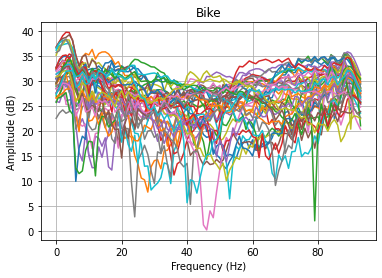

In [295]:
fig = all_test.loc[all_test.index=="bike"].iloc[:,0:94].T.plot(legend=False,grid=True,title="Bike")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

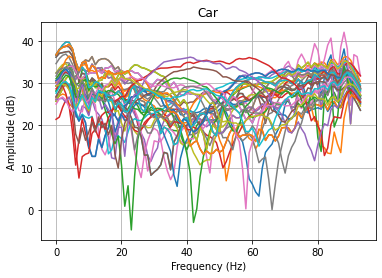

In [296]:
fig = all_test.loc[all_test.index=="car"].iloc[:,0:94].T.plot(legend=False,grid=True,title="Car")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

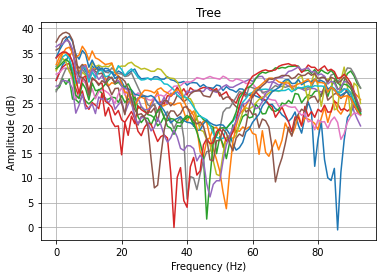

In [297]:
fig = all_test.loc[all_test.index=="tree"].iloc[:,0:94].T.plot(legend=False,grid=True,title="Tree")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

In [1721]:
list1 = [x for x in w_maj_true_lab if x != []]

In [1722]:
list2 = [x for x in w_maj_pre_lab if x != []]

In [1720]:
w_maj_pre_lab

['signpost',
 [],
 'signpost',
 [],
 'tree',
 'tree',
 'tree',
 'tree',
 'wall',
 'tree',
 'wall',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'wall',
 'car',
 'car',
 'car',
 'car',
 'car',
 'car',
 'wall',
 'car',
 'car',
 'car',
 'car',
 'car',
 'wall',
 'wall',
 'car',
 'car',
 'wall',
 'car',
 [],
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'wall',
 'signpost',
 'wall',
 'wall',
 'wall',
 'wall',
 'wall',
 [],
 'wall',
 'wall',
 [],
 'wall',
 'wall',
 [],
 [],
 [],
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 [],
 'tree',
 [],
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'signpost',
 'signpost']

In [1724]:
print("Weighted majority vote results...")
print(confusion_matrix(list1, list2))
print(classification_report(list1, list2))

Weighted majority vote results...
[[14  0  0  4]
 [ 0 18  1  0]
 [ 0  2 13  3]
 [ 0  5  0 10]]
              precision    recall  f1-score   support

         car       1.00      0.78      0.88        18
    signpost       0.72      0.95      0.82        19
        tree       0.93      0.72      0.81        18
        wall       0.59      0.67      0.62        15

    accuracy                           0.79        70
   macro avg       0.81      0.78      0.78        70
weighted avg       0.82      0.79      0.79        70



In [51]:
read_data(dates,"20210310_15:45:59.889-20210310_15:46:12.812")

,0,1,2,3,4,5,6,7,8,9,...,1108,1109,1110,1111,1112,1113,1114,1115,1116,1117
car,26.882781,27.722171,28.296247,28.465722,27.995775,26.675160,24.993234,26.400442,28.068018,27.066378,...,1.000000,0.189346,-0.661914,0.360724,0.988918,0.533905,0.058454,-0.248199,-0.387897,-0.431961
car,24.702272,25.492389,26.272771,26.685311,26.459097,25.410832,24.683842,26.037707,27.313119,26.326172,...,0.999228,0.087266,-0.708814,0.433954,1.000000,0.470529,0.026583,-0.275349,-0.425107,-0.467416
car,24.226542,24.844311,25.321889,25.584985,25.410109,24.927622,24.942211,26.371990,27.619589,27.027088,...,1.000000,0.072587,-0.692936,0.478687,0.995206,0.476340,0.020287,-0.269595,-0.429170,-0.469501
car,25.008996,25.930106,26.913508,27.442831,26.606461,25.289722,24.918223,26.648206,28.183174,27.197100,...,0.629673,-0.047599,-0.468549,0.403614,0.630283,0.254665,-0.030570,-0.220817,-0.291912,-0.315171
car,26.379711,26.815587,27.426167,27.673401,27.267096,25.813827,24.275609,25.599398,27.287400,26.278556,...,0.643567,-0.006378,-0.420259,0.322007,0.572178,0.230734,-0.033446,-0.200832,-0.294645,-0.322180
car,27.046814,27.853112,28.682952,29.347190,28.847695,27.545852,26.365711,27.597237,29.297460,28.275928,...,0.253054,-0.026159,-0.182297,0.175381,0.262237,0.109446,-0.017152,-0.097537,-0.141026,-0.154730
car,26.573914,27.377508,28.147935,28.707310,28.382933,26.870168,25.725281,27.417869,29.183332,28.056550,...,0.483521,-0.019173,-0.244249,0.293010,0.380622,0.152034,-0.032061,-0.159543,-0.206968,-0.224423
car,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [1443]:
test_data

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-191.940456,136.313252,218.208496,117.628266,166.614911,221.230078,-193.336380,-88.171790,213.975573,-86.998341,...,-10.802778,19.898271,4.630721,-0.513196,0.399416,3.833182,-1.748878,-4.834155,24.310233,-10.725584
1,-334.882712,77.232463,-92.072257,-4.200748,191.233644,265.419624,113.121778,83.343548,189.449227,133.913441,...,10.473249,6.665110,-9.983417,-10.327702,21.214645,-6.028111,-3.160940,14.961317,1.861065,13.062930
2,-175.761576,113.205043,-41.470809,52.406100,146.818634,77.170721,-50.745847,131.706088,91.699094,-84.629484,...,-2.306037,-18.852000,-15.556279,1.145137,-9.644499,-4.594856,11.752722,2.170209,-2.864277,-7.963176
3,45.991708,107.078665,-51.446693,-65.570800,67.513421,239.352122,-161.802932,-103.140912,68.903263,61.601101,...,24.794669,-3.135333,-8.474263,17.056008,19.789258,-4.877104,14.927197,-18.321090,5.180929,-11.679696
4,-273.001634,51.146020,-29.321342,181.788123,174.141828,166.612158,-78.032967,151.746087,20.458200,-116.338808,...,1.068050,-5.744562,-3.324961,10.089957,8.538894,-8.501721,6.139797,-5.855204,-4.239513,7.955034
5,-192.016154,145.756277,51.616893,154.689548,153.014898,117.891420,-77.095265,116.305682,205.628073,-45.386778,...,-6.272374,-11.304978,12.206954,2.861269,11.167300,-3.870657,-24.401747,-11.444556,2.034772,-3.084428
6,-215.072983,205.041044,38.174191,40.532926,228.727997,105.602949,-44.811477,-143.174430,26.150657,40.106219,...,-0.771110,-7.920553,-8.726199,3.597647,11.863746,2.468879,-5.892986,-3.841524,-7.409164,5.637331
7,-189.587052,102.867008,-25.565335,43.154281,217.965501,223.004332,-49.092990,1.718399,116.260795,-0.697088,...,-7.942431,-15.187094,19.627178,-29.430394,0.410763,4.824938,-4.175717,-7.320942,-4.140459,-0.533106


In [1428]:
train_data.isna().any()

0      True
1      True
2      True
3      True
4      True
       ... 
367    True
368    True
369    True
370    True
371    True
Length: 932, dtype: bool

In [1434]:
train_data.index[train_data.T.isna().any()]

Index(['car'], dtype='object')

In [1440]:
train_data.loc[train_data.index == "car"].isna().any().any()

True

In [1556]:
len(header)

94

In [1563]:
train_data.iloc[:,0:95]

,0,1,2,3,4,5,6,7,8,9,...,85,86,87,88,89,90,91,92,93,0
tree,27.068252,27.973446,29.321533,29.840631,29.374044,28.654863,27.145099,28.621990,29.901435,30.136166,...,27.867256,25.531509,27.060760,30.071617,31.932579,32.111562,31.586878,30.810727,29.843995,27.068252
tree,26.612533,27.250634,27.904517,28.546546,28.760140,28.091126,27.768868,28.832945,30.094015,29.868356,...,27.734896,25.876248,28.457536,31.785216,32.977736,33.467278,32.794170,31.882707,30.785157,26.612533
tree,26.925489,27.824173,28.906977,29.692831,29.962518,28.991181,27.933634,28.703471,30.053607,29.169883,...,28.891658,26.592096,28.586552,31.989287,33.448458,33.553564,33.105277,32.062064,31.080040,26.925489
tree,28.321461,28.422128,29.212062,29.689393,29.071889,26.939887,26.078640,27.257444,29.264035,28.453243,...,29.447670,26.274205,28.020556,30.955526,32.456270,32.753888,32.317800,31.588041,30.586838,28.321461
tree,26.361802,26.798903,27.724523,28.240576,28.421980,27.528254,28.261214,29.631015,30.923899,30.333657,...,29.389990,27.893527,29.906007,32.805773,34.051893,34.060409,33.336374,32.204977,30.980925,26.361802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
signpost,23.892255,24.415531,24.706139,24.839912,24.768763,24.624769,24.971450,26.013199,27.111010,26.652443,...,26.863775,24.095861,25.035555,28.410335,30.083930,30.455250,30.211615,29.643477,28.777125,23.892255
signpost,23.674065,24.234799,24.795618,25.354207,25.753145,25.267445,25.234791,26.161117,27.078519,26.633394,...,26.217214,23.557733,24.133372,27.751249,29.858339,30.474240,30.273689,29.644473,28.778422,23.674065
signpost,23.012844,23.249270,23.942315,24.276642,24.401683,24.631078,25.106826,26.031026,27.102919,26.780889,...,25.687308,22.889690,22.877764,26.655526,28.779602,29.473918,29.456809,29.025851,28.307285,23.012844
signpost,23.503646,24.112960,24.899270,25.333053,25.161173,24.641758,24.744231,25.676945,26.775072,26.494341,...,26.579954,24.443754,24.318857,26.978474,28.698331,29.318552,29.273547,28.815175,28.091604,23.503646


In [1380]:
np.unique(y_pred, return_counts = True)

(array(['tree', 'wall'], dtype='<U4'), array([5, 3]))

In [1381]:
from collections import Counter
Counter(y_pred).most_common(1)[0][0]

'tree'

In [151]:
from sklearn.preprocessing import MinMaxScaler
def normalize_data(training_data, testing_data):
    train_len = len(training_data)
    test_len = len(testing_data)
    temp = pd.get_dummies(pd.concat([training_data,testing_data],keys=[0,1]))
    temp.dropna(axis=1,inplace=True)
    #scaler = MinMaxScaler()
    #dt = scaler.fit_transform(temp)
    
    #temp_min = temp.min().min()
    #temp_max = temp.max().max()
    
    #n_temp = (temp - temp_min)/(temp_max - temp_min)
    n_temp=(temp-temp.mean())/temp.std()
    
    training_data = n_temp[:train_len]
    testing_data = n_temp[train_len:]
    training_data.reset_index(level=0, drop=True, inplace=True)
    testing_data.reset_index(level=0, drop=True, inplace=True)
    return pd.DataFrame(training_data), pd.DataFrame(testing_data)

In [185]:
ntrain,ntest = normalize_data(X_train, X_test)

In [298]:
df_slize = all_test.iloc[:,0:94]
header = [18016.0, 18048.0, 18080.0, 18112.0, 18144.0, 18176.0, 18208.0,
              18240.0, 18272.0, 18304.0, 18336.0, 18368.0, 18400.0, 18432.0,
              18464.0, 18496.0, 18528.0, 18560.0, 18592.0, 18624.0, 18656.0,
              18688.0, 18720.0, 18752.0, 18784.0, 18816.0, 18848.0, 18880.0,
              18912.0, 18944.0, 18976.0, 19008.0, 19040.0, 19072.0, 19104.0,
              19136.0, 19168.0, 19200.0, 19232.0, 19264.0, 19296.0, 19328.0,
              19360.0, 19392.0, 19424.0, 19456.0, 19488.0, 19520.0, 19552.0,
              19584.0, 19616.0, 19648.0, 19680.0, 19712.0, 19744.0, 19776.0,
              19808.0, 19840.0, 19872.0, 19904.0, 19936.0, 19968.0, 20000.0,
              20032.0, 20064.0, 20096.0, 20128.0, 20160.0, 20192.0, 20224.0,
              20256.0, 20288.0, 20320.0, 20352.0, 20384.0, 20416.0, 20448.0,
              20480.0, 20512.0, 20544.0, 20576.0, 20608.0, 20640.0, 20672.0,
              20704.0, 20736.0, 20768.0, 20800.0, 20832.0, 20864.0, 20896.0,
              20928.0, 20960.0, 20992.0]
df_slize.columns = header

In [299]:
normalized_df=(df_slize-df_slize.mean())/df_slize.std()

In [300]:
ntrain.reset_index(level=0, drop=True, inplace=True)

(18000.0, 21000.0)

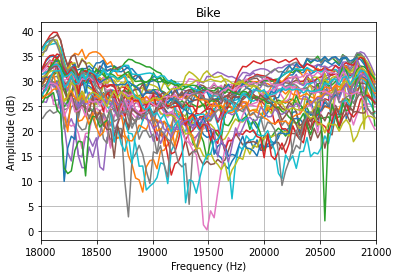

In [302]:
fig = df_slize.loc[df_slize.index=="bike"].T.plot(legend=False,grid=True,title="Bike")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")
plt.xlim((18000,21000))

Text(0, 0.5, 'Amplitude (dB)')

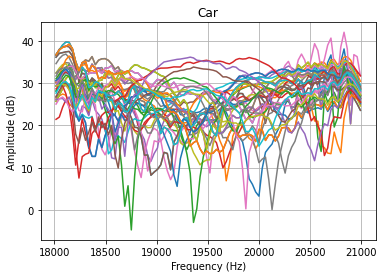

In [303]:
fig = df_slize.loc[df_slize.index=="car"].T.plot(legend=False,grid=True,title="Car")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Normalized amplitude (dB)')

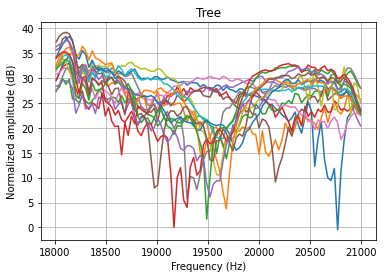

In [306]:
fig = df_slize.loc[df_slize.index=="tree"].T.plot(legend=False,grid=True,title="Tree")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Normalized amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

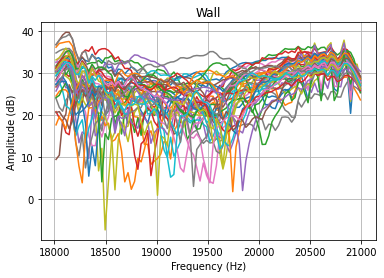

In [307]:
fig = df_slize.loc[df_slize.index=="wall"].T.plot(legend=False,grid=True,title="Wall")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

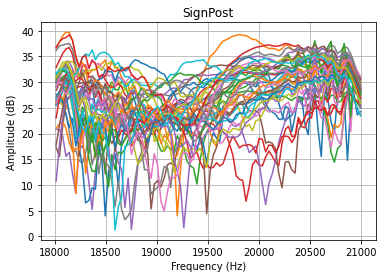

In [308]:
fig = df_slize.loc[df_slize.index=="signpost"].T.plot(legend=False,grid=True,title="SignPost")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

(18000.0, 21000.0)

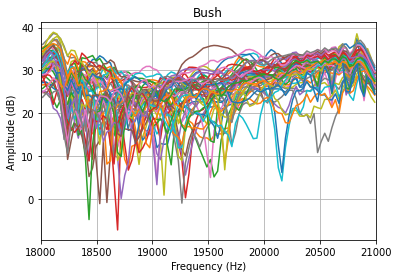

In [309]:
fig = df_slize.loc[df_slize.index=="bush"].T.plot(legend=False,grid=True,title="Bush")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")
plt.xlim((18000,21000))

Text(0, 0.5, 'Amplitude (dB)')

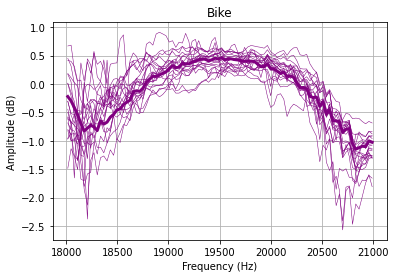

In [35]:
df_slize.loc[df_slize.index=="bike"].sample(20).T.plot(legend=False,grid=True,title="Bike",color='purple',lw=0.5)
df_slize.loc[df_slize.index=="bike"].T.mean(axis=1).plot(legend=False,grid=True,title="Bike",lw=3,color='purple')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

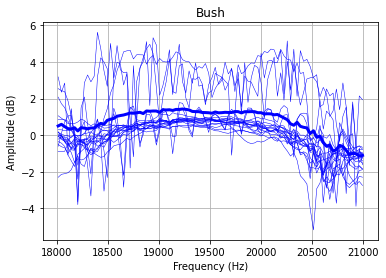

In [84]:
df_slize.loc[df_slize.index=="bush"].sample(20).T.plot(legend=False,grid=True,title="Bush",color='blue',lw=0.5)
df_slize.loc[df_slize.index=="bush"].T.mean(axis=1).plot(legend=False,grid=True,title="Bush",lw=3,color='blue')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

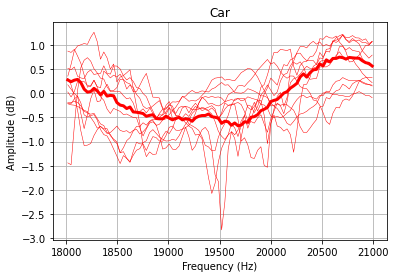

In [85]:
df_slize.loc[df_slize.index=="car"].sample(10).T.plot(legend=False,grid=True,title="Car",color='red',lw=0.5)
df_slize.loc[df_slize.index=="car"].T.mean(axis=1).plot(legend=False,grid=True,title="Car",lw=3,color='red')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

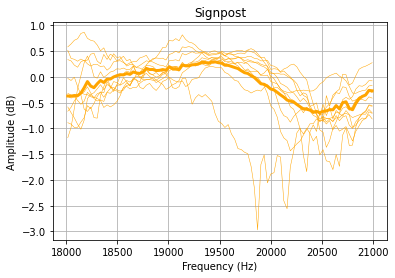

In [88]:
df_slize.loc[df_slize.index=="signpost"].sample(10).T.plot(legend=False,grid=True,title="Signpost",color='orange',lw=0.5)
df_slize.loc[df_slize.index=="signpost"].T.mean(axis=1).plot(legend=False,grid=True,title="Signpost",lw=3,color='orange')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

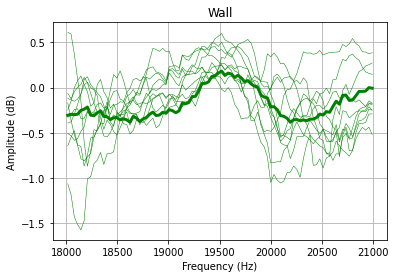

In [90]:
df_slize.loc[df_slize.index=="wall"].sample(10).T.plot(legend=False,grid=True,title="Wall",color='green',lw=0.5)
df_slize.loc[df_slize.index=="wall"].T.mean(axis=1).plot(legend=False,grid=True,title="Wall",lw=3,color='green')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude (dB)")

In [100]:
df_slize.loc[df_slize.index=="tree"].sample(10).T.plot(legend=False,grid=True,title="Tree",color='black',lw=0.5)
df_slize.loc[df_slize.index=="tree"].T.mean(axis=1).plot(legend=False,grid=True,title="Tree",lw=3,color='black')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude (dB)")

ValueError: Cannot take a larger sample than population when 'replace=False'

Text(0, 0.5, 'Amplitude (dB)')

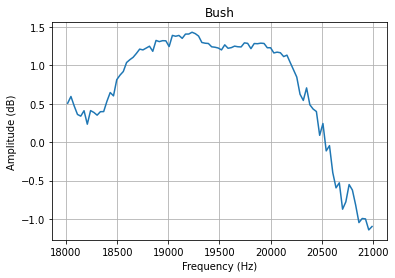

In [71]:
fig = df_slize.loc[df_slize.index=="bush"].T.mean(axis=1).plot(legend=False,grid=True,title="Bush")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

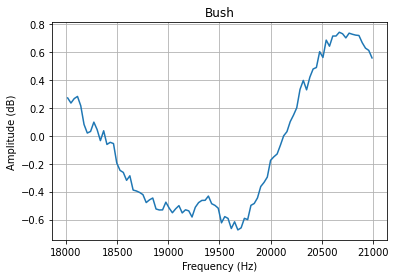

In [72]:
fig = df_slize.loc[df_slize.index=="car"].T.mean(axis=1).plot(legend=False,grid=True,title="Bush")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

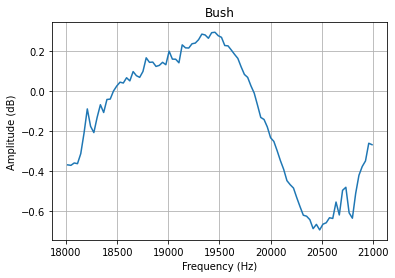

In [73]:
fig = df_slize.loc[df_slize.index=="signpost"].T.mean(axis=1).plot(legend=False,grid=True,title="Bush")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

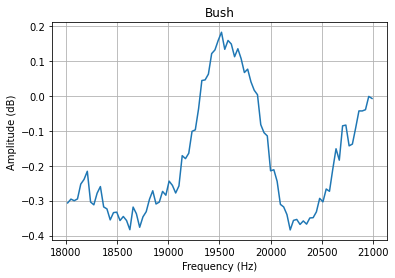

In [74]:
fig = df_slize.loc[df_slize.index=="wall"].T.mean(axis=1).plot(legend=False,grid=True,title="Bush")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

In [1598]:
df_diff = df_slize.diff(axis=1)
df_diff.dropna(inplace=True,axis=1)
#norm_diff = df_diff / df_diff.max(axis=1).values
norm_diff = df_diff.divide(df_diff.max(axis=1).values, axis=0)

Text(17.200000000000003, 0.5, 'Amplitude (dB)')

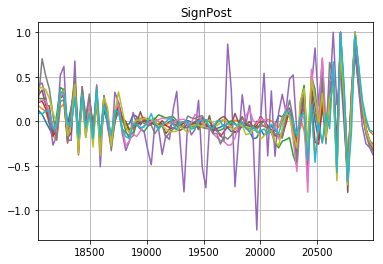

In [1600]:
norm_diff.loc[norm_diff.index=="signpost"].sample(10).T.plot(legend=False,grid=True,title="SignPost")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(17.200000000000003, 0.5, 'Amplitude (dB)')

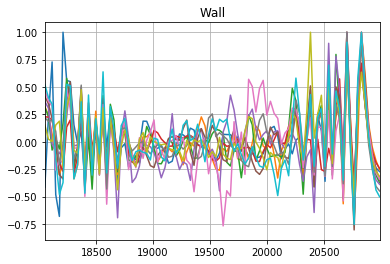

In [1601]:
norm_diff.loc[norm_diff.index=="wall"].sample(10).T.plot(legend=False,grid=True,title="Wall")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(17.200000000000003, 0.5, 'Amplitude (dB)')

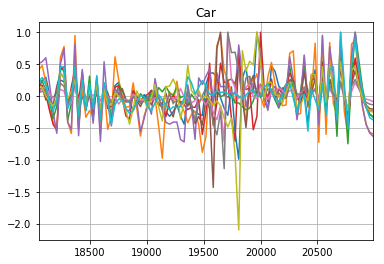

In [1611]:
norm_diff.loc[norm_diff.index=="car"].sample(10).T.plot(legend=False,grid=True,title="Car")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(17.200000000000003, 0.5, 'Amplitude (dB)')

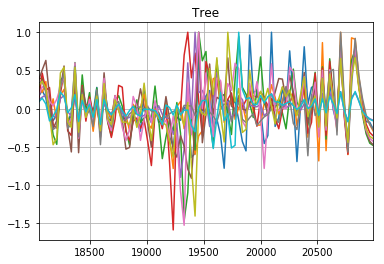

In [1612]:
norm_diff.loc[norm_diff.index=="tree"].sample(10).T.plot(legend=False,grid=True,title="Tree")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

In [1258]:
feature1 = pd.read_csv("processed/" + "spectrum/" + "20210315" + "/right/" + ts, index_col=False, header=None)

In [1260]:
feature1

,0,1,2,3,4,5,6,7,8,9,...,84,85,86,87,88,89,90,91,92,93
0,27.638507,28.937326,29.639633,29.634741,28.897015,27.947680,26.481577,28.085526,29.408841,28.321746,...,23.759304,26.636682,29.334534,30.373984,30.338401,29.699175,28.773571,27.767778,26.801719,25.929846
1,25.281094,26.338737,26.945251,26.900161,26.624105,25.457449,25.017278,26.407372,27.558314,26.463489,...,28.522765,28.982350,27.137416,28.216815,30.612688,31.925281,32.145865,31.595532,30.689260,29.718393
2,24.659816,25.238893,25.903383,26.216310,26.374402,25.789783,25.923317,27.144321,28.258561,27.165358,...,28.630633,28.985825,26.871852,28.086975,30.865045,32.335047,32.519449,31.952957,31.080842,30.094052
3,24.341402,24.864348,25.183961,25.158777,25.889722,25.270187,24.908729,26.088597,27.574207,27.318509,...,29.411945,29.409111,27.500899,28.836706,31.422260,32.765319,32.910679,32.344630,31.336412,30.270388
4,24.142133,24.796019,25.437176,25.755631,25.767721,24.797367,24.348355,25.593074,26.505905,25.775339,...,29.470621,29.719214,27.736254,28.843607,31.381885,32.644538,32.800935,32.212319,31.280033,30.287117
5,25.983368,26.036256,26.687921,27.167571,27.056868,25.832012,24.128640,25.459463,26.802632,25.701554,...,29.288899,29.653199,27.633311,28.679796,31.367977,32.832141,32.993897,32.465985,31.431045,30.326865
6,25.100009,26.155743,27.038095,26.980084,26.730295,26.418279,26.328255,26.976780,28.506457,28.395502,...,29.106624,29.329507,27.482303,28.822871,31.481432,32.709754,32.766520,32.138271,31.138364,30.021374
7,24.437736,25.832884,26.931064,27.888527,27.126206,26.644360,26.071526,27.499538,28.380835,28.209968,...,27.722360,27.901463,25.896936,27.213004,30.167236,31.600193,31.925277,31.573938,30.735993,29.724871


In [1280]:
session[:8]

'20210310'

In [1262]:
session

'20210310_15:25:26.159-20210310_15:25:39.816'

In [1237]:
np.unique(train_data.index)

array(['car', 'tree'], dtype=object)

In [1163]:
pred_prob

[['tree', [0.78, 0.87, 0.9, 0.94, 0.9, 0.87, 0.89, 0.92]],
 ['tree', [0.7, 0.86, 0.82, 0.8, 0.78, 0.75, 0.82, 0.89]],
 ['tree', [0.75, 0.73, 0.68, 0.78, 0.74, 0.78, 0.5, 0.74]],
 ['tree', [0.82, 0.8, 0.87, 0.91, 0.72, 0.88, 0.76, 0.9]],
 ['tree', [0.68, 0.85, 0.74, 0.82, 0.7, 0.87, 0.89, 0.74]],
 ['tree', [0.91, 0.77, 0.75, 0.8, 0.7, 0.43, 0.92, 0.8]],
 ['tree', [0.84, 0.69, 0.78, 0.77, 0.74, 0.86, 0.74, 0.55]],
 ['tree', [0.59, 0.7, 0.74, 0.57, 0.71, 0.61, 0.51, 0.67]],
 ['tree', [0.81, 0.61, 0.44, 0.65, 0.61, 0.84, 0.57, 0.42]],
 ['tree', [0.75, 0.75, 0.71, 0.76, 0.9, 0.71, 0.77, 0.9]],
 ['tree', [0.66, 0.56, 0.51, 0.58, 0.29, 0.44, 0.6, 0.48]],
 ['tree', [0.66, 0.65, 0.65, 0.4, 0.76, 0.55, 0.96, 0.72]],
 ['tree', [0.83, 0.65, 0.71, 0.62, 0.65, 0.63, 0.67, 0.74]],
 ['tree', [0.7, 0.71, 0.69, 0.69, 0.82, 0.42, 0.33, 0.37]],
 ['tree', [0.64, 0.76, 0.86, 0.68, 0.51, 0.66, 0.6, 0.68]],
 ['tree', [0.41, 0.27, 0.4, 0.29, 0.31, 0.9, 0.45, 0.43]],
 ['tree', [0.5, 0.39, 0.71, 0.63, 0.42, 0.72

In [1169]:
index

[[0.78, 0.87, 0.9, 0.94, 0.9, 0.87, 0.89, 0.92],
 [0.7, 0.86, 0.82, 0.8, 0.78, 0.75, 0.82, 0.89],
 [0.75, 0.73, 0.68, 0.78, 0.74, 0.78, 0.5, 0.74],
 [0.82, 0.8, 0.87, 0.91, 0.72, 0.88, 0.76, 0.9],
 [0.68, 0.85, 0.74, 0.82, 0.7, 0.87, 0.89, 0.74],
 [0.91, 0.77, 0.75, 0.8, 0.7, 0.43, 0.92, 0.8],
 [0.84, 0.69, 0.78, 0.77, 0.74, 0.86, 0.74, 0.55],
 [0.59, 0.7, 0.74, 0.57, 0.71, 0.61, 0.51, 0.67],
 [0.81, 0.61, 0.44, 0.65, 0.61, 0.84, 0.57, 0.42],
 [0.75, 0.75, 0.71, 0.76, 0.9, 0.71, 0.77, 0.9],
 [0.66, 0.56, 0.51, 0.58, 0.29, 0.44, 0.6, 0.48],
 [0.66, 0.65, 0.65, 0.4, 0.76, 0.55, 0.96, 0.72],
 [0.83, 0.65, 0.71, 0.62, 0.65, 0.63, 0.67, 0.74],
 [0.7, 0.71, 0.69, 0.69, 0.82, 0.42, 0.33, 0.37],
 [0.64, 0.76, 0.86, 0.68, 0.51, 0.66, 0.6, 0.68],
 [0.41, 0.27, 0.4, 0.29, 0.31, 0.9, 0.45, 0.43],
 [0.5, 0.39, 0.71, 0.63, 0.42, 0.72, 0.43, 0.71],
 [0.65, 0.84, 0.72, 0.77, 0.81, 0.72, 0.79, 0.72],
 [0.66, 0.71, 0.7, 0.72, 0.7, 0.7, 0.62, 0.68],
 [0.43, 0.27, 0.36, 0.22, 0.36, 0.49, 0.34, 0.25],
 [0.

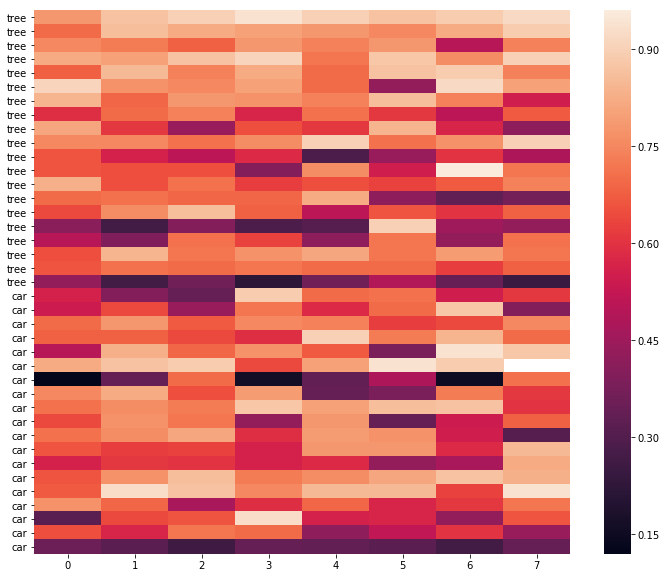

In [1172]:
probs = pd.DataFrame([row[1] for row in pred_prob])
index = [row[0] for row in pred_prob]
probs.index = index
plt.figure(figsize=(12,10))
sns.heatmap(probs)

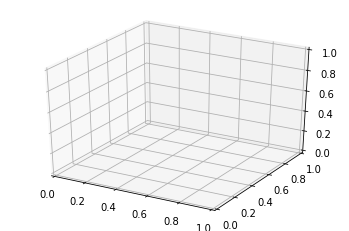

In [1174]:
from mpl_toolkits import mplot3d
fig = plt.figure()
ax = plt.axes(projection='3d')

In [1180]:
x = np.linspace(0, 8, 8)
y = np.linspace(0, len(probs[probs.index=="car"]), len(probs[probs.index=="car"]))
X, Y = np.meshgrid(x, y)
Z = probs[probs.index=="car"]

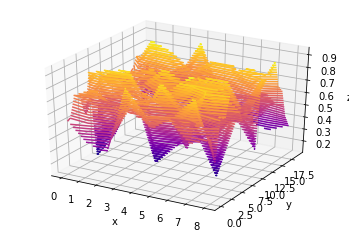

In [1187]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, Z, 50, rstride=1, cstride=1,
                cmap='plasma', edgecolor='none')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z');

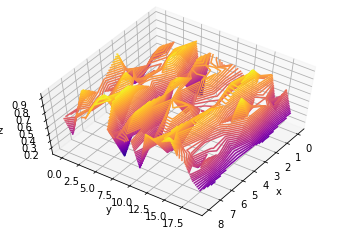

In [1188]:
ax.view_init(60, 35)
fig

In [1191]:
x = np.linspace(0, 8, 8)
y = np.linspace(0, len(probs[probs.index=="tree"]), len(probs[probs.index=="tree"]))
X, Y = np.meshgrid(x, y)
Z = probs[probs.index=="tree"]

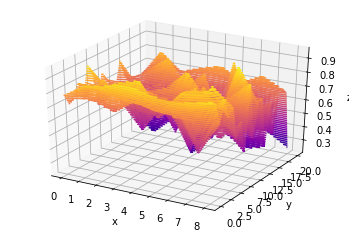

In [1192]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, Z, 50, rstride=1, cstride=1,
                cmap='plasma', edgecolor='none')
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z');

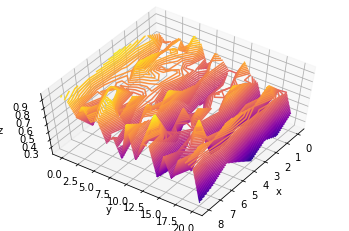

In [1193]:
ax.view_init(60, 35)
fig

In [1134]:
model = RandomForestClassifier(n_estimators=100, criterion="entropy",
                               max_features = 'sqrt')
# Fit on training data
model.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_features='sqrt')

In [1160]:
model.predict_proba(X_test)[:,1].tolist()

[0.58, 0.61, 0.66, 0.57, 0.6, 0.6, 0.62, 0.65]

In [1335]:
def visualize_features(date):
    test_feat = pd.DataFrame()
    header = [18016.0, 18048.0, 18080.0, 18112.0, 18144.0, 18176.0, 18208.0,
              18240.0, 18272.0, 18304.0, 18336.0, 18368.0, 18400.0, 18432.0,
              18464.0, 18496.0, 18528.0, 18560.0, 18592.0, 18624.0, 18656.0,
              18688.0, 18720.0, 18752.0, 18784.0, 18816.0, 18848.0, 18880.0,
              18912.0, 18944.0, 18976.0, 19008.0, 19040.0, 19072.0, 19104.0,
              19136.0, 19168.0, 19200.0, 19232.0, 19264.0, 19296.0, 19328.0,
              19360.0, 19392.0, 19424.0, 19456.0, 19488.0, 19520.0, 19552.0,
              19584.0, 19616.0, 19648.0, 19680.0, 19712.0, 19744.0, 19776.0,
              19808.0, 19840.0, 19872.0, 19904.0, 19936.0, 19968.0, 20000.0,
              20032.0, 20064.0, 20096.0, 20128.0, 20160.0, 20192.0, 20224.0,
              20256.0, 20288.0, 20320.0, 20352.0, 20384.0, 20416.0, 20448.0,
              20480.0, 20512.0, 20544.0, 20576.0, 20608.0, 20640.0, 20672.0,
              20704.0, 20736.0, 20768.0, 20800.0, 20832.0, 20864.0, 20896.0,
              20928.0, 20960.0, 20992.0] #frequency bands
    for s in session_list:
        if "20210310" == s[:8]:
            #print(s)
            feature = pd.read_csv("processed/" + "mfcc/" + date + "/right/" + s, index_col=False, header=None)
            feature = label_data(s,feature1,date)
            test_feat = pd.concat([test_feat,feature],axis=0)
        else:continue    
    test_feat.columns = header
    fig = test_feat.loc[test_feat.index=="tree"].sample(50).T.plot(legend=False,grid=True,title="Tree")
    fig.set_xlabel("Frequency (Hz)")
    fig.set_ylabel("Amplitude (dB)")

In [1336]:
visualize_features("20210315")

FileNotFoundError: [Errno 2] File b'processed/mfcc/20210315/right/20210310_15:25:26.159-20210310_15:25:39.816' does not exist: b'processed/mfcc/20210315/right/20210310_15:25:26.159-20210310_15:25:39.816'

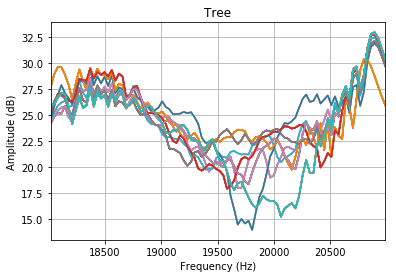

In [1337]:
visualize_features("20210310")

In [1326]:
session_list

['20210310_15:25:26.159-20210310_15:25:39.816',
 '20210310_15:25:48.350-20210310_15:25:58.158',
 '20210310_15:26:14.684-20210310_15:26:25.036',
 '20210310_15:26:36.351-20210310_15:26:45.720',
 '20210310_15:26:59.160-20210310_15:27:08.845',
 '20210310_15:27:20.548-20210310_15:27:30.566',
 '20210310_15:29:00.353-20210310_15:29:09.829',
 '20210310_15:29:25.107-20210310_15:29:34.689',
 '20210310_15:29:41.711-20210310_15:29:51.347',
 '20210310_15:30:04.369-20210310_15:30:13.898',
 '20210310_15:30:21.964-20210310_15:30:32.030',
 '20210310_15:30:50.167-20210310_15:31:01.015',
 '20210310_15:31:09.318-20210310_15:31:20.694',
 '20210310_15:31:57.174-20210310_15:32:07.006',
 '20210310_15:32:14.252-20210310_15:32:24.462',
 '20210310_15:32:32.730-20210310_15:32:42.915',
 '20210310_15:32:48.233-20210310_15:32:58.401',
 '20210310_15:33:58.721-20210310_15:34:08.178',
 '20210310_15:34:21.045-20210310_15:34:32.102',
 '20210310_15:34:48.696-20210310_15:34:57.898',
 '20210310_15:42:00.571-20210310_15:42:1

In [ ]:
fig = test_feat.loc[test_feat.index=="wall"].sample(50).T.plot(legend=False,grid=True,title="Wall")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

In [1304]:
test_feat = pd.DataFrame()
for s in session_list:
    if "20210315" == s[:8]:
        feature1 = pd.read_csv("processed/" + "spectrum/" + "20210315" + "/right/" + session, index_col=False, header=None)
        feature1 = label_data(s,feature1,"20210315")
        test_feat = pd.concat([test_feat,feature1],axis=0)

In [1305]:
test_feat 


,0,1,2,3,4,5,6,7,8,9,...,84,85,86,87,88,89,90,91,92,93
wall,27.638507,28.937326,29.639633,29.634741,28.897015,27.947680,26.481577,28.085526,29.408841,28.321746,...,23.759304,26.636682,29.334534,30.373984,30.338401,29.699175,28.773571,27.767778,26.801719,25.929846
wall,25.281094,26.338737,26.945251,26.900161,26.624105,25.457449,25.017278,26.407372,27.558314,26.463489,...,28.522765,28.982350,27.137416,28.216815,30.612688,31.925281,32.145865,31.595532,30.689260,29.718393
wall,24.659816,25.238893,25.903383,26.216310,26.374402,25.789783,25.923317,27.144321,28.258561,27.165358,...,28.630633,28.985825,26.871852,28.086975,30.865045,32.335047,32.519449,31.952957,31.080842,30.094052
wall,24.341402,24.864348,25.183961,25.158777,25.889722,25.270187,24.908729,26.088597,27.574207,27.318509,...,29.411945,29.409111,27.500899,28.836706,31.422260,32.765319,32.910679,32.344630,31.336412,30.270388
wall,24.142133,24.796019,25.437176,25.755631,25.767721,24.797367,24.348355,25.593074,26.505905,25.775339,...,29.470621,29.719214,27.736254,28.843607,31.381885,32.644538,32.800935,32.212319,31.280033,30.287117
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
wall,24.341402,24.864348,25.183961,25.158777,25.889722,25.270187,24.908729,26.088597,27.574207,27.318509,...,29.411945,29.409111,27.500899,28.836706,31.422260,32.765319,32.910679,32.344630,31.336412,30.270388
wall,24.142133,24.796019,25.437176,25.755631,25.767721,24.797367,24.348355,25.593074,26.505905,25.775339,...,29.470621,29.719214,27.736254,28.843607,31.381885,32.644538,32.800935,32.212319,31.280033,30.287117
wall,25.983368,26.036256,26.687921,27.167571,27.056868,25.832012,24.128640,25.459463,26.802632,25.701554,...,29.288899,29.653199,27.633311,28.679796,31.367977,32.832141,32.993897,32.465985,31.431045,30.326865
wall,25.100009,26.155743,27.038095,26.980084,26.730295,26.418279,26.328255,26.976780,28.506457,28.395502,...,29.106624,29.329507,27.482303,28.822871,31.481432,32.709754,32.766520,32.138271,31.138364,30.021374


In [1313]:
spectrum_set2.columns

Float64Index([18016.0, 18048.0, 18080.0, 18112.0, 18144.0, 18176.0, 18208.0,
              18240.0, 18272.0, 18304.0, 18336.0, 18368.0, 18400.0, 18432.0,
              18464.0, 18496.0, 18528.0, 18560.0, 18592.0, 18624.0, 18656.0,
              18688.0, 18720.0, 18752.0, 18784.0, 18816.0, 18848.0, 18880.0,
              18912.0, 18944.0, 18976.0, 19008.0, 19040.0, 19072.0, 19104.0,
              19136.0, 19168.0, 19200.0, 19232.0, 19264.0, 19296.0, 19328.0,
              19360.0, 19392.0, 19424.0, 19456.0, 19488.0, 19520.0, 19552.0,
              19584.0, 19616.0, 19648.0, 19680.0, 19712.0, 19744.0, 19776.0,
              19808.0, 19840.0, 19872.0, 19904.0, 19936.0, 19968.0, 20000.0,
              20032.0, 20064.0, 20096.0, 20128.0, 20160.0, 20192.0, 20224.0,
              20256.0, 20288.0, 20320.0, 20352.0, 20384.0, 20416.0, 20448.0,
              20480.0, 20512.0, 20544.0, 20576.0, 20608.0, 20640.0, 20672.0,
              20704.0, 20736.0, 20768.0, 20800.0, 20832.0, 20864.0, 20896.0,

In [1309]:
test_feat.columns = spectrum_set2.columns

Text(0, 0.5, 'Amplitude (dB)')

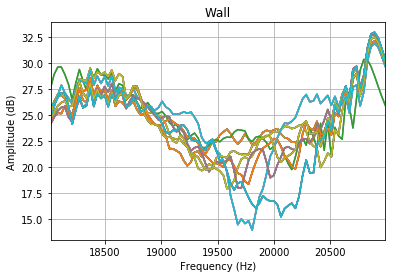

In [1312]:
#train_data.columns = spectrum_set.columns
fig = test_feat.loc[test_feat.index=="wall"].sample(50).T.plot(legend=False,grid=True,title="Wall")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

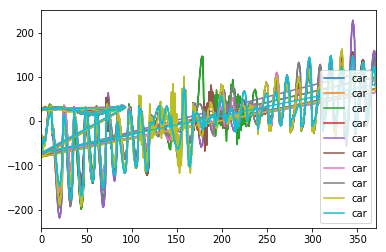

In [1346]:
train_data.loc[train_data.index=="car"].sample(10).T.plot()

In [1078]:
X_train.isnull().T.any()

tree    False
tree    False
tree    False
tree    False
tree    False
        ...  
car     False
car     False
car     False
car     False
car     False
Length: 303, dtype: bool

In [1066]:
y_train.tolist()

['tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 'tree',
 

In [1026]:
X_train

,0,1,2,3,4,5,6,7,8,9,...,362,363,364,365,366,367,368,369,370,371
car,-66.867725,-48.704899,-66.832636,-66.124118,-64.633264,-50.977131,-34.985209,-15.462404,0.551945,13.599046,...,20.080176,34.912756,53.420889,74.274299,94.410063,109.214104,115.226088,109.349773,90.712625,61.469451
car,-60.396380,-46.230600,-61.446022,-61.009136,-58.633230,-44.825272,-27.562091,-6.282423,12.503179,28.382499,...,19.832092,40.336114,68.138254,99.900806,131.336702,155.769841,167.980560,163.669706,141.763321,105.151772
car,-63.628677,-40.074223,-53.824376,-52.652101,-52.697125,-42.311129,-29.687194,-12.824662,1.990472,15.218809,...,32.321899,42.558919,59.775929,73.993840,88.936674,98.034868,101.212643,93.916886,77.352303,51.941116
car,-60.771666,-40.324227,-53.631355,-50.835132,-48.416436,-35.220894,-19.989606,-1.340570,14.008989,26.270071,...,14.236092,33.322095,58.396928,88.546590,118.742003,143.397666,156.648870,154.372291,134.714612,99.886595
car,-58.625777,-33.700834,-44.379349,-40.851375,-39.531091,-28.598578,-16.111462,0.131346,14.008864,26.014745,...,24.564040,37.507193,56.412656,78.319696,104.147242,128.358446,147.633666,155.526414,148.918970,126.491297
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
car,-52.705512,-37.283736,-54.659141,-58.186419,-62.131411,-57.093121,-49.915139,-38.647641,-27.986555,-16.854450,...,-18.463377,-29.649520,-42.963515,-57.131762,-71.354161,-83.892002,-93.532171,-98.876192,-99.294243,-94.915800
car,-56.038173,-29.834964,-37.018495,-27.741702,-19.476361,-4.346717,6.666098,13.001181,8.233335,-5.397705,...,-5.906695,-23.981198,-48.014137,-76.403711,-103.436899,-124.652165,-135.322440,-133.897830,-120.506041,-98.900463
car,-65.807650,-54.655788,-83.881781,-96.315103,-112.556097,-116.185548,-116.561475,-107.899787,-96.094177,-78.830907,...,-42.686962,-40.197136,-24.957572,-0.512410,27.410196,52.648469,70.220761,76.641819,70.494899,54.675047
car,-48.821831,-15.197609,-18.205659,-11.100644,-9.997983,-4.867474,-3.008731,-1.625253,-4.424766,-8.571397,...,-16.186634,-11.228337,-1.677807,10.105342,19.320109,22.825114,18.143969,6.120914,-10.360406,-27.357390


In [1037]:
train_list

['20210310_15:25:48.350-20210310_15:25:58.158',
 '20210310_15:26:14.684-20210310_15:26:25.036',
 '20210310_15:26:36.351-20210310_15:26:45.720',
 '20210310_15:26:59.160-20210310_15:27:08.845',
 '20210310_15:27:20.548-20210310_15:27:30.566',
 '20210310_15:29:00.353-20210310_15:29:09.829',
 '20210310_15:29:25.107-20210310_15:29:34.689',
 '20210310_15:29:41.711-20210310_15:29:51.347',
 '20210310_15:30:04.369-20210310_15:30:13.898',
 '20210310_15:30:21.964-20210310_15:30:32.030',
 '20210310_15:30:50.167-20210310_15:31:01.015',
 '20210310_15:31:09.318-20210310_15:31:20.694',
 '20210310_15:31:57.174-20210310_15:32:07.006',
 '20210310_15:32:14.252-20210310_15:32:24.462',
 '20210310_15:32:32.730-20210310_15:32:42.915',
 '20210310_15:32:48.233-20210310_15:32:58.401',
 '20210310_15:33:58.721-20210310_15:34:08.178',
 '20210310_15:34:21.045-20210310_15:34:32.102',
 '20210310_15:34:48.696-20210310_15:34:57.898',
 '20210310_15:42:00.571-20210310_15:42:11.946',
 '20210310_15:42:19.717-20210310_15:42:3

In [1019]:
np.unique(y_train, return_counts=True)

(array(['car'], dtype=object), array([304]))

In [962]:
c = 0
for x in range(10):
    print("|" + "*"*(c+1) + ' '*(len(range(10))-1-c)+ "| " +str(format(((c+1)/len(range(10)))*100,".3f")) + "% is complete..." ,end="\r")
    time.sleep(1)
    c = c+1

KeyboardInterrupt: 

In [960]:
print(format(432.456, ".2f"))

432.46


In [917]:
import time
for x in range (0,5):  
    b = "Loading" + "." * x
    print (b, end="\r")
    time.sleep(1)

In [908]:
print("* " + len(train_list)*"\t" + str(count/len(train_list)) + "% is complete..." ,end="")

* 																																						0.0% is complete...

In [825]:
print(confusion_matrix(true_labels, predicted_labels))
print(classification_report(true_labels, predicted_labels))

NameError: name 'true_labels' is not defined

In [826]:
true_laels

[Index(['up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up'],
       dtype='object'),
 Index(['up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up'],
       dtype='object'),
 Index(['up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up', 'up',
        'up', 'up', 'up', 'up'

# Calculate MFCC

In [532]:
def calc_mfcc(sample_rate,signal): 
    ##Pre-emphasis##
    pre_emphasis = 0.97
    emphasized_signal = np.append(signal[0], signal[1:] - pre_emphasis * signal[:-1])



    ##Framing##
    frame_size = 0.001#0.01#0.01#0.025#
    frame_stride = 0.001#0.00155#0.00144#overlapping=frame_size-frame_stride
    #overlapping=float(frame_size-frame_stride)/frame_size
    frame_length, frame_step = frame_size * sample_rate, frame_stride * sample_rate
    signal_length = len(emphasized_signal)
    frame_length = int(round(frame_length))
    frame_step = int(round(frame_step))
    num_frames = int(np.ceil(float(np.abs(signal_length - frame_length)) / frame_step))
    #print "num_frames=",num_frames
    pad_signal_length = num_frames * frame_step + frame_length
    z = np.zeros((pad_signal_length - signal_length))
    pad_signal = np.append(emphasized_signal, z)
    indices = np.tile(np.arange(0, frame_length), (num_frames, 1)) + np.tile(np.arange(0, num_frames * frame_step, frame_step), (frame_length, 1)).T
    frames = pad_signal[indices.astype(np.int32, copy=False)]



    ##Window##
    frames *= np.hamming(frame_length)
    #frames *= blackman(frame_length)



    ##Fourier-transform and power spectrum##
    NFFT = 1024
    mag_frames = np.absolute(np.fft.rfft(frames, NFFT)) #magnitude of the FFT
    pow_frames = ((1.0 / NFFT) * ((mag_frames) ** 2)) #power spectrum
    pow_frames_new = pow_frames[:,400:500]
    #print "pow_frames=",len(pow_frames)
    #print "pow_frames=",pow_frames.shape
    #print "pow_frames=",type(pow_frames)



    ##Filter banks##
    nfilt = 40
    low_freq_mel = (2595 * np.log10(1 + (18000) / 700)) #thilina was 18000 instead of 20
    high_freq_mel = (2595 * np.log10(1 + (sample_rate / 2) / 700)) #thilina was sample_rate/2#convert Hz to Mel
    
    mel_points = np.linspace(low_freq_mel, high_freq_mel, nfilt + 2) #equally spaced in Mel scale
    hz_points = (700 * (10**(mel_points / 2595) - 1)) #converts Mel to Hz
    bin = np.floor((NFFT +1) * hz_points / sample_rate)
    #print "hz_points=",hz_points
    fbank = np.zeros((nfilt, int(np.floor(NFFT / 2 +1))))
    #fbank = np.zeros((nfilt,100))
    #print "fbank=",fbank.shape
    for m in range(1, nfilt + 1):
        f_m_minus = int(bin[m - 1]) #left
        f_m = int(bin[m]) #center
        f_m_plus = int(bin[m + 1]) #right

        for k in range(f_m_minus, f_m):
            fbank[m - 1, k] = (k - bin[m - 1]) / (bin[m] - bin[m - 1])
        for k in range(f_m, f_m_plus):
            fbank[m - 1, k] = (bin[m + 1] - k) / (bin[m + 1] - bin[m])
    #print "fbank=",fbank.shape
    filter_banks = np.dot(pow_frames, fbank.T)
    #fbank_new = fbank[:,0:100]
    #filter_banks = np.dot(pow_frames_new, fbank_new.T)
    filter_banks = np.where(filter_banks == 0, np.finfo(float).eps, filter_banks) #numerical stability
    filter_banks = 20 * np.log10(filter_banks) #dB



    ##Mel-Frequency Cepstral Coefficients (MFCCs)##
    num_ceps = 12
    mfcc = dct(filter_banks, type=2, axis=1, norm='ortho')[:, 1 : (num_ceps + 1)] #keep 2-13
    cep_lifter = 22
    (nframes, ncoeff) = mfcc.shape
    n = np.arange(ncoeff)
    lift = 1 + (cep_lifter / 2) * np.sin(np.pi * n / cep_lifter)
    mfcc *= lift



    ##Mean normalization##
    filter_banks -= (np.mean(filter_banks, axis=0) + 1e-8)
    mfcc -= (np.mean(mfcc, axis=0) + 1e-8)
    
    return mfcc#,mag_frames,pow_frames,filter_banks

#def mfcc(cut):
#    feat_list = []
#    mfcc_list = []
#    for cuts in cut:
#        mfcc,mag_frames,pow_frames,filter_banks = calc_mfcc(44100,cuts)
#        mfcc_list.append(mfcc)
#        feat_list.append(mfcc.T.mean(axis=0))
#    return mfcc_list

# Implement LBP

In [533]:
#import cv2
def getLBPimage(gray_image):
    '''
    == Input ==
    gray_image  : color image of shape (height, width)
    
    == Output ==  
    imgLBP : LBP converted image of the same shape as 
    '''
    
    ### Step 0: Step 0: Convert an image to grayscale
    #gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    imgLBP = np.zeros_like(gray_image)
    neighboor = 3 
    for ih in range(0,gray_image.shape[0] - neighboor):
        for iw in range(0,gray_image.shape[1] - neighboor):
            ### Step 1: 3 by 3 pixel
            img          = gray_image[ih:ih+neighboor,iw:iw+neighboor]
            center       = img[1,1]
            img01        = (img >= center)*1.0
            img01_vector = img01.T.flatten()
            # it is ok to order counterclock manner
            # img01_vector = img01.flatten()
            ### Step 2: **Binary operation**:
            img01_vector = np.delete(img01_vector,4)
            ### Step 3: Decimal: Convert the binary operated values to a digit.
            where_img01_vector = np.where(img01_vector)[0]
            if len(where_img01_vector) >= 1:
                num = np.sum(2**where_img01_vector)
            else:
                num = 0
            imgLBP[ih+1,iw+1] = num
    return(imgLBP)

In [534]:
def lbp_feat_calc(mfcc):
    LBP = getLBPimage(mfcc)
    vecimgLBP = LBP.flatten()
    freq,lbp = np.histogram(vecimgLBP,bins=2**8)#plt.hist(vecimgLBP,bins=2**8)
    return pd.DataFrame(freq).T

import wave
import math
from scipy.signal import lfilter, hamming
from scikits.talkbox import lpc

def get_formants(signal):

#     # Read from file.
#     spf = wave.open(file_path, 'r') 

#     # Get file as numpy array.
#     x = spf.readframes(-1)
#     x = numpy.fromstring(x, 'Int16')

    x = signal

    # Get Hamming window.
    N = len(x)
    w = numpy.hamming(N)

    # Apply window and high pass filter.
    x1 = x * w
    x1 = lfilter([1], [1., 0.63], x1)

    # Get LPC.
    Fs = spf.getframerate()
    ncoeff = 2 + Fs / 1000
    A, e, k = lpc(x1, ncoeff)

    # Get roots.
    rts = numpy.roots(A)
    rts = [r for r in rts if numpy.imag(r) >= 0]

    # Get angles.
    angz = numpy.arctan2(numpy.imag(rts), numpy.real(rts))

    # Get frequencies.
    Fs = spf.getframerate()
    frqs = sorted(angz * (Fs / (2 * math.pi)))
    
    print( Fs)

    return frqs

In [535]:
import pylab as pl

def calculate_spectrum(signal):
    rate = sample_rate
    t = np.arange(0, 10, 1/rate)
    x = signal
    p = 20*np.log10(np.abs(np.fft.rfft(x)))
    f = np.linspace(0, rate/2, len(p))
    #print(len(p))
    #print(len(f))
    #print(f)
    #plt.plot(p[500:750])
    spectrum = pd.DataFrame(p)
    spectrum.index = f
    #display(spectrum[18000:21000])
    #spectrum[18000:21000].plot()
    #plot(f[18000:21000], p[18000:21000])
    #plt.show()
    return spectrum[18000:21000].T

In [567]:
spectrum_set = pd.DataFrame()
for index, row in imp_res.iterrows():
    signal = np.array(row)
    f = calculate_spectrum(signal)
    spectrum_set = pd.concat([spectrum_set, f],axis=0)
    
spectrum_set.index = imp_res.index

In [597]:
sample_rate = 192000
lbp_set = pd.DataFrame()
mfcc_set = pd.DataFrame()
for index, row in imp_res.iterrows():
    signal = np.array(row)
    #formants = get_formants(signal)
    mfcc = calc_mfcc(sample_rate,signal)
    mfcc_set = pd.concat([mfcc_set,pd.DataFrame(mfcc.flatten()).T],axis=0)
    lbp = lbp_feat_calc(mfcc)
    lbp_set = pd.concat([lbp_set,lbp], axis=0)
    #formant_set = pd.concat([formant_set, formants,axis=0])
lbp_set.index = imp_res.index
mfcc_set.index = imp_res.index
#formant_set.index = imp_res.index

In [569]:
imp_res

,0,1,2,3,4,5,6,7,8,9,...,5990,5991,5992,5993,5994,5995,5996,5997,5998,5999
up,1.000000,0.969260,0.908825,0.989286,0.921101,0.927771,0.912152,0.874023,0.898783,0.876417,...,0.001145,0.001167,0.001250,0.001256,0.001342,0.001392,0.001486,0.001584,0.001593,0.001723
up,0.971051,0.980487,0.868356,0.990316,0.958439,0.969557,1.000000,0.956753,0.989548,0.965979,...,0.001524,0.001586,0.001713,0.001745,0.001837,0.001950,0.001990,0.002089,0.002157,0.002243
up,1.000000,0.970494,0.911710,0.990879,0.922174,0.927577,0.911043,0.872501,0.896990,0.875171,...,0.002311,0.002327,0.002417,0.002420,0.002502,0.002549,0.002620,0.002702,0.002692,0.002794
up,0.969012,0.978506,0.867178,0.989212,0.957687,0.969271,1.000000,0.957369,0.990555,0.967481,...,0.002745,0.002794,0.002858,0.002845,0.002917,0.002959,0.002965,0.003022,0.003042,0.003081
up,0.973444,0.980699,0.869764,0.991099,0.958245,0.970049,1.000000,0.957659,0.991206,0.968318,...,0.004055,0.004088,0.004139,0.004109,0.004169,0.004194,0.004181,0.004213,0.004203,0.004213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
no,0.970797,0.986022,0.867737,0.991918,0.961456,0.969189,1.000000,0.952360,0.981330,0.953422,...,0.002182,0.002231,0.002264,0.002256,0.002326,0.002302,0.002377,0.002410,0.002397,0.002518
no,1.000000,0.967031,0.897535,0.978217,0.908443,0.913047,0.898540,0.857705,0.882164,0.857665,...,0.005592,0.005618,0.005605,0.005593,0.005646,0.005618,0.005657,0.005698,0.005684,0.005709
no,0.955784,0.977029,0.860017,0.985416,0.959249,0.966756,1.000000,0.952871,0.981408,0.954653,...,0.003386,0.003409,0.003502,0.003498,0.003579,0.003586,0.003637,0.003701,0.003665,0.003772
no,0.986873,0.983820,0.878839,0.997329,0.958847,0.973637,1.000000,0.961182,0.997184,0.976049,...,0.001928,0.001948,0.002083,0.002139,0.002250,0.002336,0.002397,0.002543,0.002549,0.002661


In [30]:
from sklearn.ensemble import RandomForestClassifier
import pickle

def randomForest(train, train_labels):
    # Create the model with 100 trees
    model = RandomForestClassifier(n_estimators=100, criterion="entropy",
                                   max_features = 'sqrt')
    # Fit on training data
    model.fit(train, train_labels)
    #pickle.dump(model, open(root + str(test_env) + "/training_phase/" + "randomForest.sav", 'wb'))
    return model 

In [31]:
from sklearn.model_selection import cross_val_score, cross_val_predict
def make_classifier(data_set):
    X = data_set
    y = data_set.index

    clf = RandomForestClassifier(n_estimators=100, criterion="entropy",
                                       max_features = 'sqrt')#svm.SVC(kernel='linear', C=1, random_state=42)
    scores = cross_val_score(clf, X, y, cv=5)
    print(scores)
    return X,y,clf

In [598]:
from sklearn.metrics import confusion_matrix, classification_report

X,y,clf = make_classifier(mfcc_set)#make_classifier(spectrum_set)
y_pred = cross_val_predict(clf, X, y, cv=5)
conf_mat = confusion_matrix(y, y_pred)
class_report = classification_report(y, y_pred)

[0.9        0.91111111 0.86666667 0.93333333 0.95555556]


In [599]:
print(conf_mat)
print(class_report)

[[137  11   2]
 [ 15 133   2]
 [  1   8 141]]
              precision    recall  f1-score   support

          no       0.90      0.91      0.90       150
        side       0.88      0.89      0.88       150
          up       0.97      0.94      0.96       150

    accuracy                           0.91       450
   macro avg       0.91      0.91      0.91       450
weighted avg       0.91      0.91      0.91       450



In [600]:
X,y,clf = make_classifier(spectrum_set)#make_classifier(spectrum_set)
y_pred = cross_val_predict(clf, X, y, cv=5)
conf_mat = confusion_matrix(y, y_pred)
class_report = classification_report(y, y_pred)

[0.6        0.62222222 0.7        0.64444444 0.71111111]


In [601]:
print(conf_mat)
print(class_report)

[[ 95  17  38]
 [  8 129  13]
 [ 41  23  86]]
              precision    recall  f1-score   support

          no       0.66      0.63      0.65       150
        side       0.76      0.86      0.81       150
          up       0.63      0.57      0.60       150

    accuracy                           0.69       450
   macro avg       0.68      0.69      0.68       450
weighted avg       0.68      0.69      0.68       450



In [602]:
X,y,clf = make_classifier(lbp_set)#make_classifier(spectrum_set)
y_pred = cross_val_predict(clf, X, y, cv=5)
conf_mat = confusion_matrix(y, y_pred)
class_report = classification_report(y, y_pred)

[0.6        0.6        0.44444444 0.52222222 0.57777778]


In [603]:
print(conf_mat)
print(class_report)

[[79 28 43]
 [43 84 23]
 [41 26 83]]
              precision    recall  f1-score   support

          no       0.48      0.53      0.50       150
        side       0.61      0.56      0.58       150
          up       0.56      0.55      0.56       150

    accuracy                           0.55       450
   macro avg       0.55      0.55      0.55       450
weighted avg       0.55      0.55      0.55       450



Text(0, 0.5, 'Number of pixels')

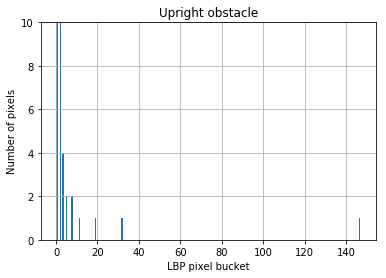

In [237]:
fig = lbp_set[lbp_set.index == "up"].sample(1).T.plot.hist(bins=256,legend=False,grid=True,title="Upright obstacle")
fig.set_ylim(0,10)
fig.set_xlabel("LBP pixel bucket")
fig.set_ylabel("Number of pixels")

Text(0, 0.5, 'Number of pixels')

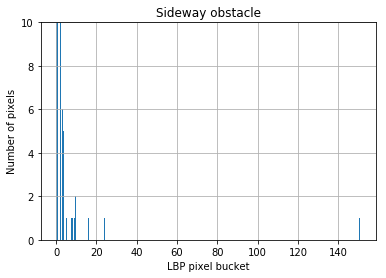

In [239]:
fig = lbp_set[lbp_set.index == "side"].sample(1).T.plot.hist(bins=256,legend=False,grid=True,title="Sideway obstacle")
fig.set_ylim(0,10)
fig.set_xlabel("LBP pixel bucket")
fig.set_ylabel("Number of pixels")

Text(0, 0.5, 'Number of pixels')

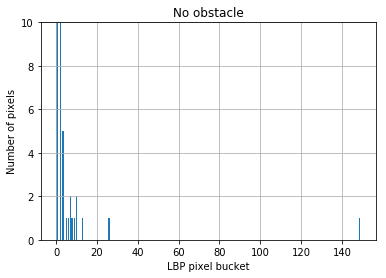

In [241]:
fig = lbp_set[lbp_set.index == "no"].sample(1).T.plot.hist(bins=256,legend=False,grid=True,title="No obstacle")
fig.set_ylim(0,10)
fig.set_xlabel("LBP pixel bucket")
fig.set_ylabel("Number of pixels")

In [1110]:
spectrum_set

,18016.0,18048.0,18080.0,18112.0,18144.0,18176.0,18208.0,18240.0,18272.0,18304.0,...,20704.0,20736.0,20768.0,20800.0,20832.0,20864.0,20896.0,20928.0,20960.0,20992.0
up,4.987012,4.973449,5.041511,4.951221,4.781305,4.900796,4.936826,5.220144,5.075964,5.338536,...,4.156915,4.011694,3.569983,4.079016,4.814984,4.933381,4.552484,4.137366,3.630691,3.302495
up,3.864323,3.878415,3.922678,3.875885,3.825019,3.715066,3.620799,3.545875,3.511012,3.509694,...,2.631736,2.619557,2.550994,2.654751,2.800040,2.800487,2.662187,2.533510,2.441068,2.390191
up,5.314335,5.254130,5.277071,4.970014,4.732719,4.854832,4.911063,5.190550,5.199665,5.319738,...,4.421184,4.221638,3.787435,4.201147,4.840190,4.922833,4.478109,4.014013,3.581579,3.229814
up,3.758502,3.761994,3.771257,3.731734,3.666011,3.590499,3.549241,3.567818,3.606356,3.657021,...,2.750058,2.737022,2.630008,2.681490,2.815350,2.824147,2.717461,2.618118,2.537442,2.469652
up,3.817302,3.756768,3.764283,3.696658,3.648614,3.636186,3.537545,3.545282,3.560276,3.482661,...,2.744373,2.727711,2.605198,2.700098,2.905280,2.955048,2.863241,2.732201,2.597312,2.510599
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
no,3.899478,3.967707,3.932398,3.957515,3.884467,3.825975,3.790454,3.706950,3.658912,3.604144,...,2.572013,2.567347,2.453329,2.467729,2.532771,2.535597,2.504008,2.442378,2.400085,2.385937
no,4.924086,5.008426,5.259913,5.237179,5.243482,5.049347,4.922932,5.108765,4.988050,4.780710,...,4.078058,4.014277,3.609036,3.907032,4.671140,4.761371,4.456607,3.999087,3.472303,3.128263
no,3.675593,3.655826,3.652233,3.628020,3.607642,3.586018,3.551794,3.527719,3.524143,3.486889,...,2.367034,2.348763,2.304677,2.319447,2.363825,2.375235,2.338724,2.292603,2.251583,2.209334
no,3.995337,3.971240,3.984396,4.011122,4.007436,4.007269,3.957194,3.970956,3.938541,3.884991,...,3.099504,2.945302,2.829132,3.045005,3.265940,3.166764,2.915421,2.650597,2.455864,2.361363


Text(0, 0.5, 'Amplitude (dB)')

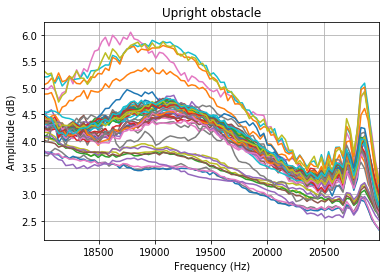

In [1109]:
fig = spectrum_set[spectrum_set.index == "up"].sample(50).T.plot(legend=False,grid=True,title="Upright obstacle")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

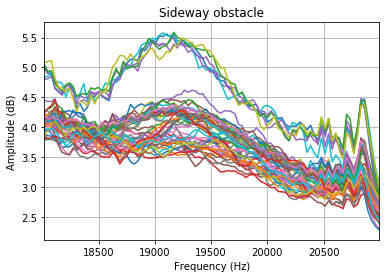

In [857]:
fig = spectrum_set[spectrum_set.index == "side"].sample(50).T.plot(legend=False,grid=True,title="Sideway obstacle")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

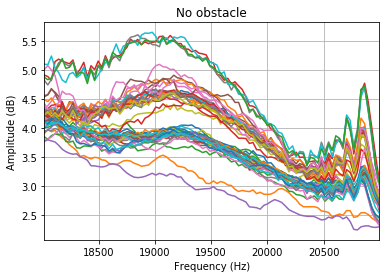

In [858]:
fig = spectrum_set[spectrum_set.index == "no"].sample(50).T.plot(legend=False,grid=True,title="No obstacle")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

In [1108]:
spectrum_set

,18016.0,18048.0,18080.0,18112.0,18144.0,18176.0,18208.0,18240.0,18272.0,18304.0,...,20704.0,20736.0,20768.0,20800.0,20832.0,20864.0,20896.0,20928.0,20960.0,20992.0
up,4.987012,4.973449,5.041511,4.951221,4.781305,4.900796,4.936826,5.220144,5.075964,5.338536,...,4.156915,4.011694,3.569983,4.079016,4.814984,4.933381,4.552484,4.137366,3.630691,3.302495
up,3.864323,3.878415,3.922678,3.875885,3.825019,3.715066,3.620799,3.545875,3.511012,3.509694,...,2.631736,2.619557,2.550994,2.654751,2.800040,2.800487,2.662187,2.533510,2.441068,2.390191
up,5.314335,5.254130,5.277071,4.970014,4.732719,4.854832,4.911063,5.190550,5.199665,5.319738,...,4.421184,4.221638,3.787435,4.201147,4.840190,4.922833,4.478109,4.014013,3.581579,3.229814
up,3.758502,3.761994,3.771257,3.731734,3.666011,3.590499,3.549241,3.567818,3.606356,3.657021,...,2.750058,2.737022,2.630008,2.681490,2.815350,2.824147,2.717461,2.618118,2.537442,2.469652
up,3.817302,3.756768,3.764283,3.696658,3.648614,3.636186,3.537545,3.545282,3.560276,3.482661,...,2.744373,2.727711,2.605198,2.700098,2.905280,2.955048,2.863241,2.732201,2.597312,2.510599
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
no,3.899478,3.967707,3.932398,3.957515,3.884467,3.825975,3.790454,3.706950,3.658912,3.604144,...,2.572013,2.567347,2.453329,2.467729,2.532771,2.535597,2.504008,2.442378,2.400085,2.385937
no,4.924086,5.008426,5.259913,5.237179,5.243482,5.049347,4.922932,5.108765,4.988050,4.780710,...,4.078058,4.014277,3.609036,3.907032,4.671140,4.761371,4.456607,3.999087,3.472303,3.128263
no,3.675593,3.655826,3.652233,3.628020,3.607642,3.586018,3.551794,3.527719,3.524143,3.486889,...,2.367034,2.348763,2.304677,2.319447,2.363825,2.375235,2.338724,2.292603,2.251583,2.209334
no,3.995337,3.971240,3.984396,4.011122,4.007436,4.007269,3.957194,3.970956,3.938541,3.884991,...,3.099504,2.945302,2.829132,3.045005,3.265940,3.166764,2.915421,2.650597,2.455864,2.361363


In [859]:
imp_res2 = pd.DataFrame()
for f in onlyfiles:
    ir = pd.read_csv("processed/" + "ir/" + date + "/right/" + f, index_col=False, header=None)
    
    if date == "20210218":
        if f in {'20210218_16:44:01.177-20210218_16:44:33.943','20210218_16:51:41.403-20210218_16:52:20.100','20210218_16:53:18.712-20210218_16:54:04.193'}:
            index = ['no']*len(ir)
        if f in {'20210218_16:57:18.254-20210218_16:58:03.582','20210218_17:00:26.185-20210218_17:01:01.872','20210218_17:01:08.542-20210218_17:01:43.332'}:
            index = ['up']*len(ir)
        if f in {'20210218_17:03:41.837-20210218_17:04:15.747','20210218_17:05:08.986-20210218_17:05:42.206','20210218_17:04:31.485-20210218_17:05:06.079'}:
            index = ['side']*len(ir)
            
    if date == "20210224":
        if f in {'20210224_17:55:21.433-20210224_17:55:55.191'}:
            index = ['up1']*len(ir)
        if f in {'20210224_17:56:04.294-20210224_17:56:39.426'}:
            index = ['up2']*len(ir)
        if f in {'20210224_17:57:00.457-20210224_17:57:34.537'}:
            index = ['up3']*len(ir)
        if f in {'20210224_17:59:54.251-20210224_18:00:26.660'}:
            index = ['side1']*len(ir)
        if f in {'20210224_18:00:38.187-20210224_18:01:11.561'}:
            index = ['side2']*len(ir)
        if f in {'20210224_18:01:26.215-20210224_18:01:58.796'}:
            index = ['side3']*len(ir)
        if f in {'20210224_18:06:50.537-20210224_18:07:23.479'}:
            index = ['no1']*len(ir)
        if f in {'20210224_18:08:00.368-20210224_18:08:33.322'}:
            index = ['no2']*len(ir)
        if f in {'20210224_18:08:37.805-20210224_18:09:11.272'}:
            index = ['no3']*len(ir)
            
    if date == "20210302":
        if f in {'20210302_18:23:30.772-20210302_18:24:04.601'}:
            index = ['up1']*len(ir)
        if f in {'20210302_18:24:11.484-20210302_18:24:43.738'}:
            index = ['up2']*len(ir)
        if f in {'20210302_18:24:49.526-20210302_18:25:20.850'}:
            index = ['up3']*len(ir)
        if f in {'20210302_18:32:33.332-20210302_18:33:05.962'}:
            index = ['side1']*len(ir)
        if f in {'20210302_18:33:12.699-20210302_18:33:44.740'}:
            index = ['side2']*len(ir)
        if f in {'20210302_18:33:51.921-20210302_18:34:24.773'}:
            index = ['side3']*len(ir)
        if f in {'20210302_18:36:32.772-20210302_18:37:04.393'}:
            index = ['no1']*len(ir)
        if f in {'20210302_18:37:21.275-20210302_18:37:52.954'}:
            index = ['no2']*len(ir)
        if f in {'20210302_18:37:59.677-20210302_18:38:31.361'}:
            index = ['no3']*len(ir)
            
        
    ir.index = index
    imp_res2 = pd.concat([imp_res2, ir], axis=0)

In [860]:
onlyfiles

['20210302_18:23:30.772-20210302_18:24:04.601',
 '20210302_18:24:11.484-20210302_18:24:43.738',
 '20210302_18:24:49.526-20210302_18:25:20.850',
 '20210302_18:32:33.332-20210302_18:33:05.962',
 '20210302_18:33:12.699-20210302_18:33:44.740',
 '20210302_18:33:51.921-20210302_18:34:24.773',
 '20210302_18:36:32.772-20210302_18:37:04.393',
 '20210302_18:37:21.275-20210302_18:37:52.954',
 '20210302_18:37:59.677-20210302_18:38:31.361']

In [861]:
imp_res2

,0,1,2,3,4,5,6,7,8,9,...,5990,5991,5992,5993,5994,5995,5996,5997,5998,5999
up1,1.000000,0.969260,0.908825,0.989286,0.921101,0.927771,0.912152,0.874023,0.898783,0.876417,...,0.001145,0.001167,0.001250,0.001256,0.001342,0.001392,0.001486,0.001584,0.001593,0.001723
up1,0.971051,0.980487,0.868356,0.990316,0.958439,0.969557,1.000000,0.956753,0.989548,0.965979,...,0.001524,0.001586,0.001713,0.001745,0.001837,0.001950,0.001990,0.002089,0.002157,0.002243
up1,1.000000,0.970494,0.911710,0.990879,0.922174,0.927577,0.911043,0.872501,0.896990,0.875171,...,0.002311,0.002327,0.002417,0.002420,0.002502,0.002549,0.002620,0.002702,0.002692,0.002794
up1,0.969012,0.978506,0.867178,0.989212,0.957687,0.969271,1.000000,0.957369,0.990555,0.967481,...,0.002745,0.002794,0.002858,0.002845,0.002917,0.002959,0.002965,0.003022,0.003042,0.003081
up1,0.973444,0.980699,0.869764,0.991099,0.958245,0.970049,1.000000,0.957659,0.991206,0.968318,...,0.004055,0.004088,0.004139,0.004109,0.004169,0.004194,0.004181,0.004213,0.004203,0.004213
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
no3,0.970797,0.986022,0.867737,0.991918,0.961456,0.969189,1.000000,0.952360,0.981330,0.953422,...,0.002182,0.002231,0.002264,0.002256,0.002326,0.002302,0.002377,0.002410,0.002397,0.002518
no3,1.000000,0.967031,0.897535,0.978217,0.908443,0.913047,0.898540,0.857705,0.882164,0.857665,...,0.005592,0.005618,0.005605,0.005593,0.005646,0.005618,0.005657,0.005698,0.005684,0.005709
no3,0.955784,0.977029,0.860017,0.985416,0.959249,0.966756,1.000000,0.952871,0.981408,0.954653,...,0.003386,0.003409,0.003502,0.003498,0.003579,0.003586,0.003637,0.003701,0.003665,0.003772
no3,0.986873,0.983820,0.878839,0.997329,0.958847,0.973637,1.000000,0.961182,0.997184,0.976049,...,0.001928,0.001948,0.002083,0.002139,0.002250,0.002336,0.002397,0.002543,0.002549,0.002661


In [862]:
spectrum_set2 = pd.DataFrame()
for index, row in imp_res2.iterrows():
    signal = np.array(row)
    f = calculate_spectrum(signal)
    spectrum_set2 = pd.concat([spectrum_set2, f],axis=0)
    
spectrum_set2.index = imp_res2.index

In [863]:
sample_rate = 192000
lbp_set2 = pd.DataFrame()
mfcc_set2 = pd.DataFrame()
for index, row in imp_res2.iterrows():
    signal = np.array(row)
    #formants = get_formants(signal)
    mfcc = calc_mfcc(sample_rate,signal)
    mfcc_set2 = pd.concat([mfcc_set2,pd.DataFrame(mfcc.flatten()).T],axis=0)
    lbp = lbp_feat_calc(mfcc)
    lbp_set2 = pd.concat([lbp_set2,lbp], axis=0)
    #formant_set = pd.concat([formant_set, formants,axis=0])
lbp_set2.index = imp_res2.index
mfcc_set2.index = imp_res2.index
#formant_set.index = imp_res.index

In [864]:
from sklearn.metrics import confusion_matrix, classification_report

X,y,clf = make_classifier(mfcc_set2)#make_classifier(spectrum_set)
y_pred = cross_val_predict(clf, X, y, cv=5)
conf_mat = confusion_matrix(y, y_pred)
class_report = classification_report(y, y_pred)

[0.57777778 0.71111111 0.82222222 0.81111111 0.74444444]


In [865]:
print(conf_mat)
print(class_report)

[[36  0  8  0  2  0  0  1  3]
 [ 2 34  8  4  0  1  0  0  1]
 [ 6 13 29  1  1  0  0  0  0]
 [ 0  1  0 39  1  6  0  2  1]
 [ 3  1  0  3 35  8  0  0  0]
 [ 0  5  1  7  0 36  1  0  0]
 [ 1  0  0  0  0  0 33 11  5]
 [ 0  0  0  1  0  0  5 36  8]
 [ 0  0  0  0  0  0  0  8 42]]
              precision    recall  f1-score   support

         no1       0.75      0.72      0.73        50
         no2       0.63      0.68      0.65        50
         no3       0.63      0.58      0.60        50
       side1       0.71      0.78      0.74        50
       side2       0.90      0.70      0.79        50
       side3       0.71      0.72      0.71        50
         up1       0.85      0.66      0.74        50
         up2       0.62      0.72      0.67        50
         up3       0.70      0.84      0.76        50

    accuracy                           0.71       450
   macro avg       0.72      0.71      0.71       450
weighted avg       0.72      0.71      0.71       450



In [866]:
date

'20210302'

# FFT of impulse responses (18 kHz - 21 kHz)

Text(0, 0.5, 'Amplitude (dB)')

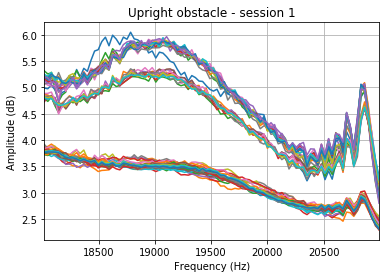

In [867]:
fig = spectrum_set2[spectrum_set2.index == "up1"].T.plot(legend=False,grid=True,title="Upright obstacle - session 1")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

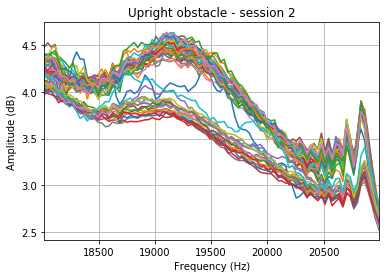

In [868]:
fig = spectrum_set2[spectrum_set2.index == "up2"].T.plot(legend=False,grid=True,title="Upright obstacle - session 2")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

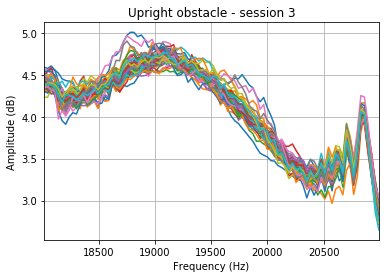

In [869]:
fig = spectrum_set2[spectrum_set2.index == "up3"].T.plot(legend=False,grid=True,title="Upright obstacle - session 3")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

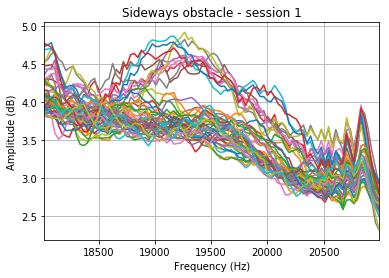

In [870]:
fig = spectrum_set2[spectrum_set2.index == "side1"].T.plot(legend=False,grid=True,title="Sideways obstacle - session 1")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

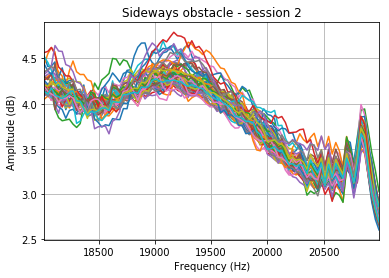

In [588]:
fig = spectrum_set2[spectrum_set2.index == "side2"].T.plot(legend=False,grid=True,title="Sideways obstacle - session 2")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

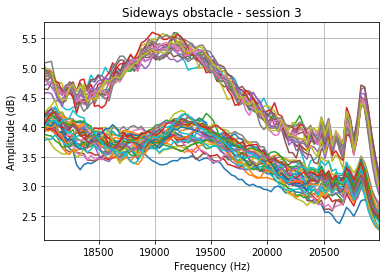

In [589]:
fig = spectrum_set2[spectrum_set2.index == "side3"].T.plot(legend=False,grid=True,title="Sideways obstacle - session 3")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

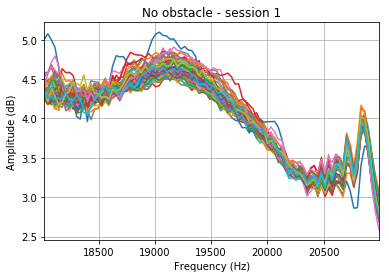

In [590]:
fig = spectrum_set2[spectrum_set2.index == "no1"].T.plot(legend=False,grid=True,title="No obstacle - session 1")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

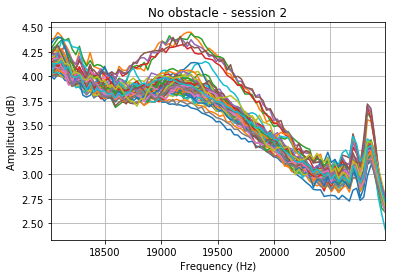

In [591]:
fig = spectrum_set2[spectrum_set2.index == "no2"].T.plot(legend=False,grid=True,title="No obstacle - session 2")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

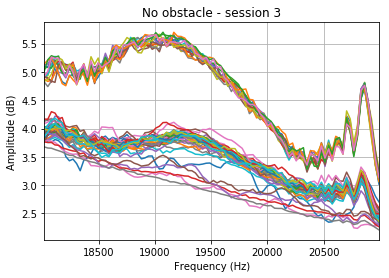

In [592]:
fig = spectrum_set2[spectrum_set2.index == "no3"].T.plot(legend=False,grid=True,title="No obstacle - session 3")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

# Raw impulse responses (65 cm -> 722 samples)

Text(0, 0.5, 'Amplitude (dB)')

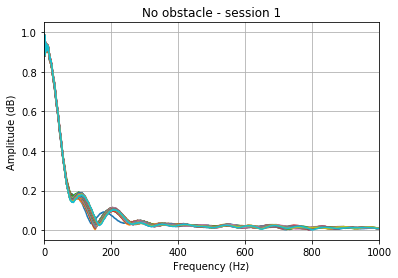

In [301]:
fig = imp_res2[imp_res2.index == "no1"].T[:1000].plot(legend=False,grid=True,title="No obstacle - session 1")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

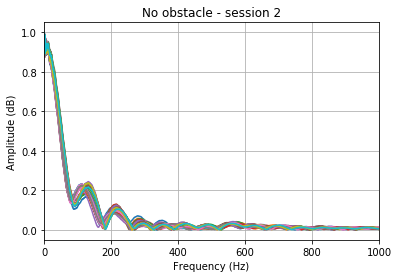

In [302]:
fig = imp_res2[imp_res2.index == "no2"].T[:1000].plot(legend=False,grid=True,title="No obstacle - session 2")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

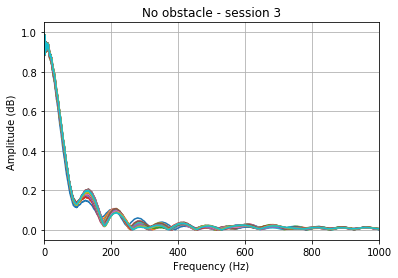

In [303]:
fig = imp_res2[imp_res2.index == "no3"].T[:1000].plot(legend=False,grid=True,title="No obstacle - session 3")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

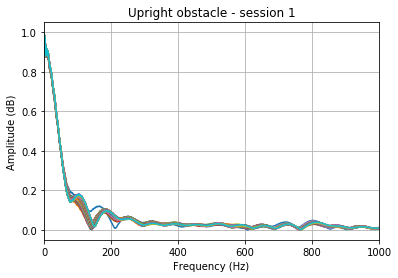

In [304]:
fig = imp_res2[imp_res2.index == "up1"].T[:1000].plot(legend=False,grid=True,title="Upright obstacle - session 1")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

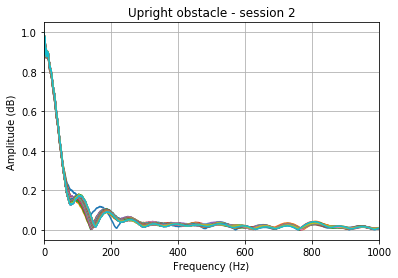

In [305]:
fig = imp_res2[imp_res2.index == "up2"].T[:1000].plot(legend=False,grid=True,title="Upright obstacle - session 2")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

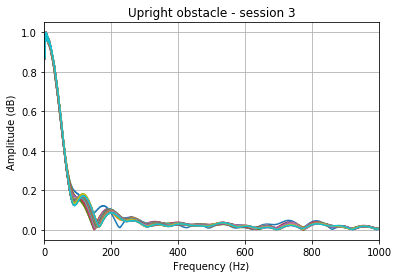

In [306]:
fig = imp_res2[imp_res2.index == "up3"].T[:1000].plot(legend=False,grid=True,title="Upright obstacle - session 3")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

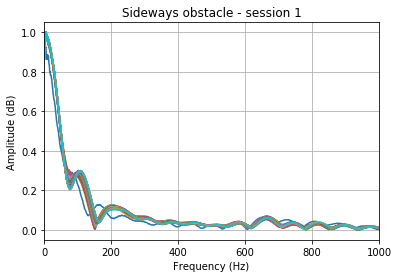

In [307]:
fig = imp_res2[imp_res2.index == "side1"].T[:1000].plot(legend=False,grid=True,title="Sideways obstacle - session 1")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

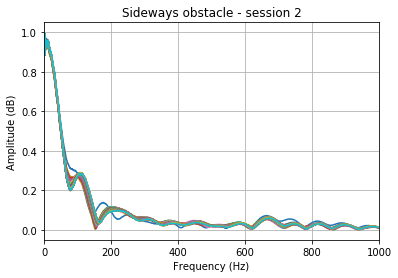

In [308]:
fig = imp_res2[imp_res2.index == "side2"].T[:1000].plot(legend=False,grid=True,title="Sideways obstacle - session 2")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

Text(0, 0.5, 'Amplitude (dB)')

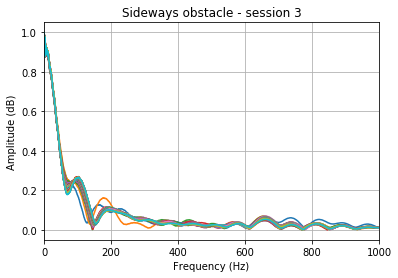

In [309]:
fig = imp_res2[imp_res2.index == "side3"].T[:1000].plot(legend=False,grid=True,title="Sideways obstacle - session 3")
fig.set_xlabel("Frequency (Hz)")
fig.set_ylabel("Amplitude (dB)")

In [436]:
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean
from tqdm import tqdm


dist_mat = []
dist_details = []
indexes = []
spec = spectrum_set2.sample(50)
spec.sort_index(inplace=True)
for index1, row1 in tqdm(spec.iterrows()):
    dist_raw = []
    indexes.append(index1)
    for index2, row2 in spec.iterrows():
        distance, path = fastdtw(row1, row2, dist=euclidean)
        dist_details.append([index1,index2,row1,row2,path])
        dist_raw.append(distance)
    dist_mat.append(dist_raw)
    #break








0it [00:00, ?it/s]






1it [00:03,  3.71s/it]






2it [00:07,  3.71s/it]






3it [00:11,  3.70s/it]






4it [00:14,  3.69s/it]






5it [00:19,  3.95s/it]






6it [00:23,  4.14s/it]






7it [00:28,  4.29s/it]






8it [00:33,  4.40s/it]






9it [00:37,  4.48s/it]






10it [00:41,  4.25s/it]






11it [00:46,  4.37s/it]






12it [00:49,  4.18s/it]






13it [00:53,  4.08s/it]






14it [00:58,  4.24s/it]






15it [01:02,  4.08s/it]






16it [01:05,  3.94s/it]






17it [01:09,  3.85s/it]






18it [01:13,  3.78s/it]






19it [01:16,  3.78s/it]






20it [01:20,  3.74s/it]






21it [01:24,  3.70s/it]






22it [01:27,  3.68s/it]






23it [01:31,  3.73s/it]






24it [01:35,  3.94s/it]






25it [01:40,  4.15s/it]






26it [01:44,  4.01s/it]






27it [01:47,  3.91s/it]






28it [01:51,  3.83s/it]






29it [01:55,  3.78s/it]






30it [01:58,  3.74s/it]






31it [02:02,  3.72s/it]






32it [02:06,  3.71s/it]






33it [02:10,  4.0

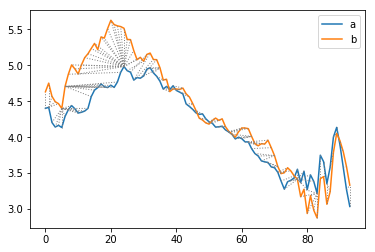

In [352]:
plt.plot(row1.tolist(), label="a")
plt.plot(row2.tolist(), label="b")

for a_x, b_x in path:
    plt.plot([a_x, b_x], [row1.tolist()[a_x], row2.tolist()[b_x]], color='gray', linestyle='dotted', linewidth=1)

plt.legend()
plt.show()

In [1308]:
spectrum_set

,18016.0,18048.0,18080.0,18112.0,18144.0,18176.0,18208.0,18240.0,18272.0,18304.0,...,20704.0,20736.0,20768.0,20800.0,20832.0,20864.0,20896.0,20928.0,20960.0,20992.0
up,4.987012,4.973449,5.041511,4.951221,4.781305,4.900796,4.936826,5.220144,5.075964,5.338536,...,4.156915,4.011694,3.569983,4.079016,4.814984,4.933381,4.552484,4.137366,3.630691,3.302495
up,3.864323,3.878415,3.922678,3.875885,3.825019,3.715066,3.620799,3.545875,3.511012,3.509694,...,2.631736,2.619557,2.550994,2.654751,2.800040,2.800487,2.662187,2.533510,2.441068,2.390191
up,5.314335,5.254130,5.277071,4.970014,4.732719,4.854832,4.911063,5.190550,5.199665,5.319738,...,4.421184,4.221638,3.787435,4.201147,4.840190,4.922833,4.478109,4.014013,3.581579,3.229814
up,3.758502,3.761994,3.771257,3.731734,3.666011,3.590499,3.549241,3.567818,3.606356,3.657021,...,2.750058,2.737022,2.630008,2.681490,2.815350,2.824147,2.717461,2.618118,2.537442,2.469652
up,3.817302,3.756768,3.764283,3.696658,3.648614,3.636186,3.537545,3.545282,3.560276,3.482661,...,2.744373,2.727711,2.605198,2.700098,2.905280,2.955048,2.863241,2.732201,2.597312,2.510599
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
no,3.899478,3.967707,3.932398,3.957515,3.884467,3.825975,3.790454,3.706950,3.658912,3.604144,...,2.572013,2.567347,2.453329,2.467729,2.532771,2.535597,2.504008,2.442378,2.400085,2.385937
no,4.924086,5.008426,5.259913,5.237179,5.243482,5.049347,4.922932,5.108765,4.988050,4.780710,...,4.078058,4.014277,3.609036,3.907032,4.671140,4.761371,4.456607,3.999087,3.472303,3.128263
no,3.675593,3.655826,3.652233,3.628020,3.607642,3.586018,3.551794,3.527719,3.524143,3.486889,...,2.367034,2.348763,2.304677,2.319447,2.363825,2.375235,2.338724,2.292603,2.251583,2.209334
no,3.995337,3.971240,3.984396,4.011122,4.007436,4.007269,3.957194,3.970956,3.938541,3.884991,...,3.099504,2.945302,2.829132,3.045005,3.265940,3.166764,2.915421,2.650597,2.455864,2.361363


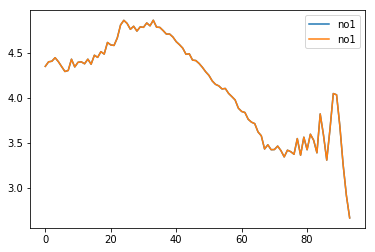

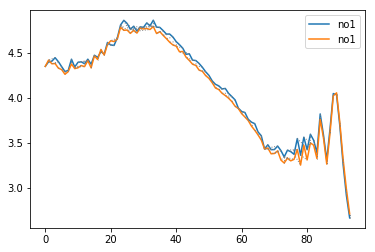

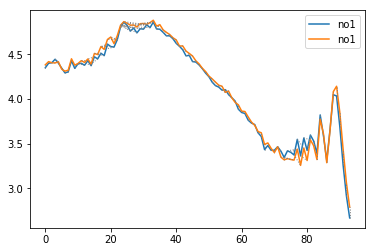

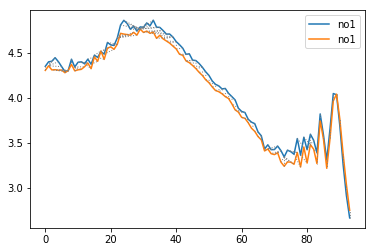

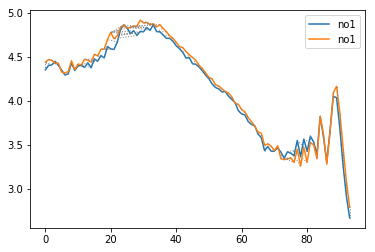

...

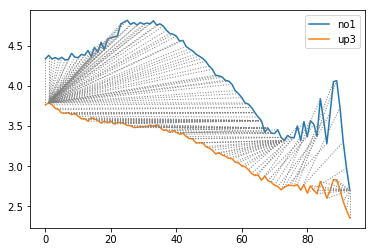

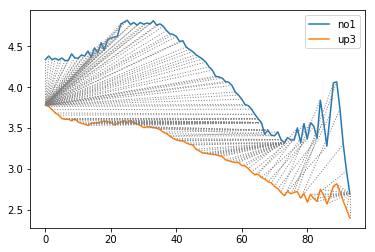

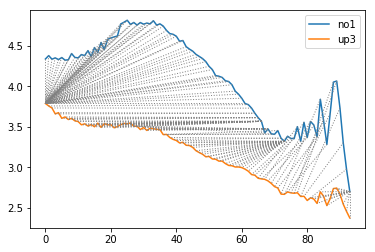

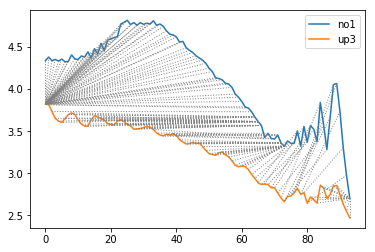

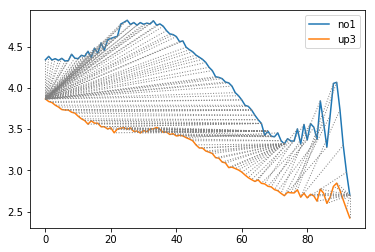

KeyboardInterrupt: 

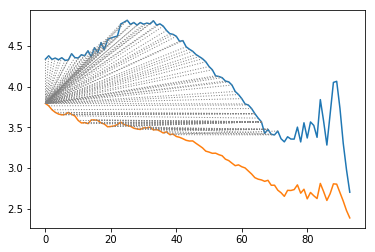

In [440]:
for dd in dist_details:
    plt.plot(dd[2].tolist(), label=dd[0])
    plt.plot(dd[3].tolist(), label=dd[1])
    
    for a_x, b_x in dd[4]:
        plt.plot([a_x, b_x], [dd[2].tolist()[a_x], dd[3].tolist()[b_x]], color='grey', linestyle='dotted', linewidth=1)

    plt.legend()  
    plt.show()

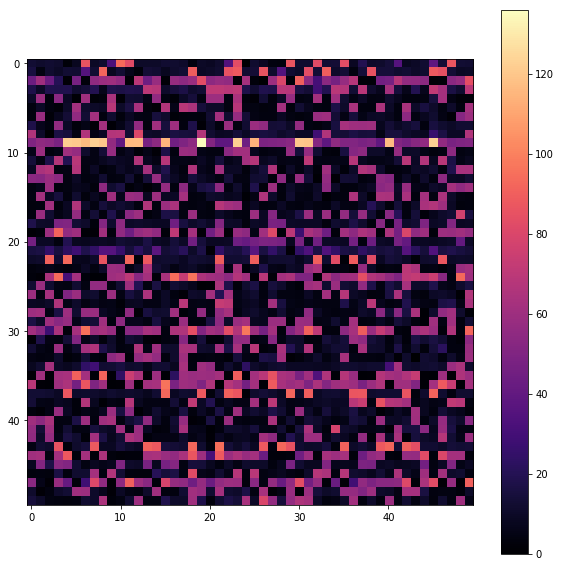

In [404]:
plt.figure(figsize=(10,10))
#plt.xticks(indexes)
plt.imshow(dist_mat,cmap='magma')
plt.colorbar()

([<matplotlib.axis.YTick at 0x7f63a0949e80>,
 <a list of 50 Text yticklabel objects>)

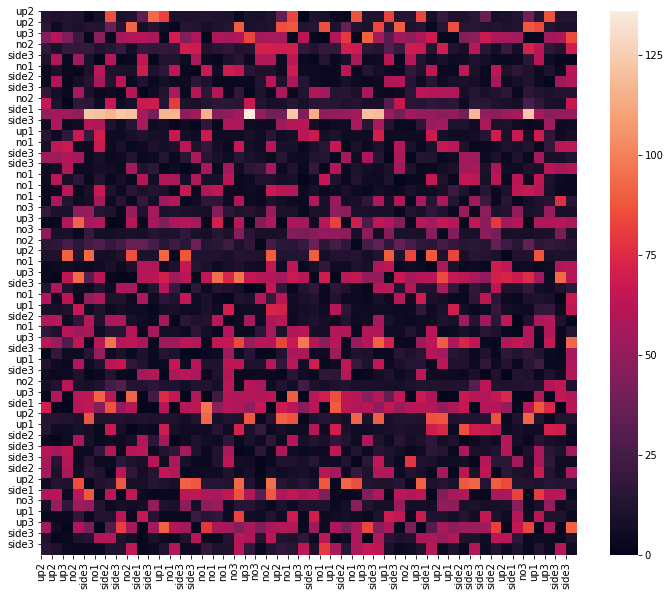

In [416]:
import seaborn as sns
plt.figure(figsize=(12,10))
sns.heatmap(dist_mat)
plt.xticks(np.arange(50),indexes)
plt.yticks(np.arange(50),indexes)

In [377]:
distance, path = fastdtw(row1, row1, dist=euclidean)

In [390]:
dist_details[0][0]

'up2'

In [392]:
indexes = [row[0] for row in dist_details]

In [398]:
len(indexes)

50

In [399]:
indexes

['up2',
 'up2',
 'up3',
 'no2',
 'side3',
 'no1',
 'side2',
 'side3',
 'no2',
 'side1',
 'side3',
 'up1',
 'no1',
 'side3',
 'side3',
 'no1',
 'no1',
 'no1',
 'no3',
 'up3',
 'no3',
 'no2',
 'up2',
 'no1',
 'up3',
 'side3',
 'no1',
 'up1',
 'side2',
 'no1',
 'up3',
 'side3',
 'up1',
 'side3',
 'no2',
 'up3',
 'side1',
 'up2',
 'up1',
 'side2',
 'side3',
 'side3',
 'side2',
 'up2',
 'side1',
 'no3',
 'up1',
 'up3',
 'side3',
 'side3']

In [437]:
df_dist_mat = pd.DataFrame(dist_mat, index=indexes, columns=indexes)

In [425]:
df_dist_mat.sort_index(inplace=True)

In [438]:
df_dist_mat

,no1,no1,no1,no1,no1,no1,no2,no2,no2,no2,...,up2,up2,up2,up2,up3,up3,up3,up3,up3,up3
no1,0.000000,3.245321,3.397379,4.490335,3.514523,2.011471,12.474772,13.805338,15.622436,10.337631,...,10.390795,10.660299,10.408134,11.063894,60.774443,61.270009,63.007137,57.831138,56.509647,60.872327
no1,3.399358,0.000000,3.300198,2.315322,3.675126,2.502931,14.472814,15.122311,13.030020,11.915338,...,13.419609,13.028138,12.249486,13.498329,56.343832,56.975527,58.317347,53.240043,52.318975,56.408151
no1,3.421463,3.300198,0.000000,4.051587,1.686285,3.274231,12.357684,14.083497,16.624278,11.151712,...,10.124792,11.051476,9.859681,10.910331,62.187827,63.476190,64.838009,58.912239,57.945796,62.488619
no1,4.490335,2.367033,4.051587,0.000000,4.910052,3.713795,15.916315,16.473371,11.736018,13.307579,...,14.727597,14.311632,13.316338,14.943950,53.645575,54.122499,55.859883,50.653753,49.798862,53.846188
no1,3.683953,3.675126,1.686285,4.685741,0.000000,3.763021,11.717859,13.403156,17.759796,10.353737,...,9.100380,10.252033,9.173853,10.404185,63.839154,65.270625,66.524943,60.634921,59.609186,64.102423
no1,2.011471,2.445606,3.349493,3.632526,3.614008,0.000000,13.912274,14.816661,15.051420,12.027058,...,11.679689,12.168195,11.118016,12.489054,59.363894,59.958214,61.808576,56.423274,55.289406,59.473025
no2,12.474772,14.427860,12.396214,15.916315,11.717859,13.912274,0.000000,3.914506,26.747204,6.106808,...,10.644013,9.091944,9.285897,9.476615,65.253748,66.623441,66.021602,63.157636,59.587571,65.234785
no2,13.805338,15.108221,14.083497,16.452453,13.403156,14.816661,3.914506,0.000000,26.521683,7.187283,...,11.638824,9.600999,9.655288,9.867753,66.148219,67.263951,67.614554,64.013104,60.757412,66.148537
no2,15.708185,13.264863,16.742347,11.736018,17.929116,15.374855,26.747204,26.521683,0.000000,21.202511,...,33.754891,31.505608,31.799585,34.938477,32.911687,33.399508,33.768814,30.615702,29.484134,32.947821
no2,10.213873,11.932574,11.184754,13.308440,10.353737,12.015599,6.106808,7.187283,21.283787,0.000000,...,10.724455,8.808878,9.144363,9.455382,58.541696,59.059768,58.540099,56.245424,53.449878,58.106151


In [428]:
df_dist_mat.sort_index(axis=1,inplace=True)

In [429]:
df_dist_mat

,no1,no1,no1,no1,no1,no1,no1,no1,no2,no2,...,up2,up2,up2,up2,up3,up3,up3,up3,up3,up3
no1,4.389361,56.451954,16.382401,8.880934,17.437559,8.595730,59.536988,4.699332,5.188097,4.197029,...,4.174117,7.069675,57.944452,57.740996,56.381524,17.067559,4.604508,12.228530,12.780571,3.950906
no1,68.562360,62.041757,6.274267,3.387018,66.675840,3.378622,63.298632,68.284687,2.486627,17.496856,...,4.048520,4.609893,9.829550,4.004357,11.057330,12.988182,14.537739,3.741347,10.997450,5.125110
no1,4.599260,66.783264,64.089119,4.523747,58.937786,3.900118,3.816136,59.496445,3.660376,9.981306,...,3.711349,62.377123,3.722289,8.783591,5.021910,4.059743,5.163926,61.332904,9.555755,3.936580
no1,58.730645,6.138282,4.218676,2.971075,7.328572,7.440492,7.053965,58.672619,53.372061,12.055590,...,16.840402,10.155425,10.199243,3.838318,5.756752,58.410986,4.084306,60.498459,60.531216,62.502178
no1,61.946856,11.735552,9.215630,11.710961,8.912225,65.468689,57.557374,8.901685,15.381657,3.834033,...,4.706077,7.905924,61.957762,10.422921,4.224344,4.834836,4.336653,8.745123,10.359114,1.572434
no1,1.783032,59.232293,4.217931,4.755110,9.805773,3.979311,10.651142,6.351975,3.784045,4.964579,...,59.183738,61.816868,4.275282,7.483894,68.430069,3.919953,9.649528,62.463800,8.695460,9.062975
no1,3.918538,67.193393,7.410415,9.805905,18.360063,14.071979,9.810452,9.431764,4.347752,10.004961,...,8.886142,9.438632,63.987193,66.847726,3.092017,4.771259,7.182595,67.070083,18.265231,3.376450
no1,8.776636,4.799073,5.044337,10.443544,9.569280,17.785733,10.394255,63.935696,4.400991,4.844262,...,3.444219,4.787423,4.404508,57.049696,4.644249,8.819558,6.459558,6.530844,5.592090,3.032653
no2,17.235964,11.705765,14.348669,68.305772,11.143005,18.927556,17.892603,70.161820,18.280422,68.525164,...,17.917598,69.256454,10.038211,69.151763,67.139406,16.385726,13.269116,18.754455,16.692194,17.923244
no2,63.102152,11.496582,8.331453,9.482701,12.409571,8.084116,11.705065,6.639471,9.689303,9.926545,...,8.336451,12.095524,12.026407,11.008048,12.394173,9.417128,60.557106,62.275941,58.741445,23.063933


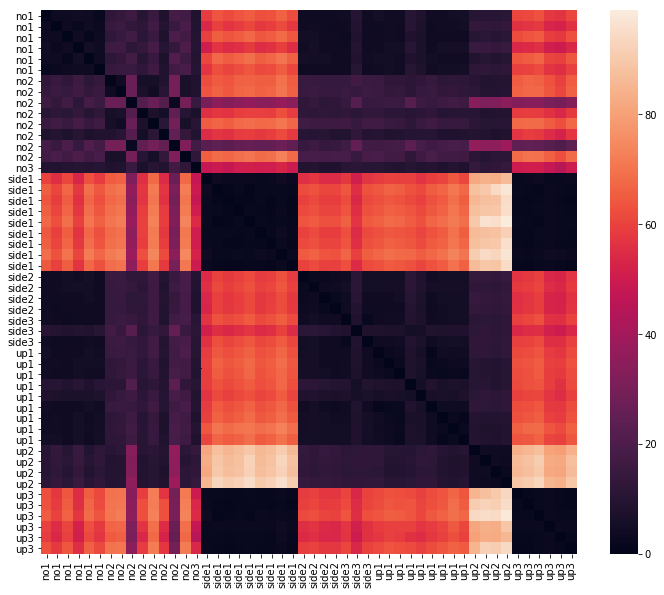

In [439]:
plt.figure(figsize=(12,10))
sns.heatmap(df_dist_mat)

In [1113]:
spectrum_set.columns

Float64Index([18016.0, 18048.0, 18080.0, 18112.0, 18144.0, 18176.0, 18208.0,
              18240.0, 18272.0, 18304.0, 18336.0, 18368.0, 18400.0, 18432.0,
              18464.0, 18496.0, 18528.0, 18560.0, 18592.0, 18624.0, 18656.0,
              18688.0, 18720.0, 18752.0, 18784.0, 18816.0, 18848.0, 18880.0,
              18912.0, 18944.0, 18976.0, 19008.0, 19040.0, 19072.0, 19104.0,
              19136.0, 19168.0, 19200.0, 19232.0, 19264.0, 19296.0, 19328.0,
              19360.0, 19392.0, 19424.0, 19456.0, 19488.0, 19520.0, 19552.0,
              19584.0, 19616.0, 19648.0, 19680.0, 19712.0, 19744.0, 19776.0,
              19808.0, 19840.0, 19872.0, 19904.0, 19936.0, 19968.0, 20000.0,
              20032.0, 20064.0, 20096.0, 20128.0, 20160.0, 20192.0, 20224.0,
              20256.0, 20288.0, 20320.0, 20352.0, 20384.0, 20416.0, 20448.0,
              20480.0, 20512.0, 20544.0, 20576.0, 20608.0, 20640.0, 20672.0,
              20704.0, 20736.0, 20768.0, 20800.0, 20832.0, 20864.0, 20896.0,

In [1233]:
predicted_labels = []
true_labels = []
pred_prob = []
for session in session_list:
    print(session)
    #test_data = pd.concat(pd.read_csv("processed/" + "spectrum/" + date + "/right/" + session, index_col=False, header=None))
    feature1 = pd.read_csv("processed/" + "spectrum/" + date + "/right/" + session, index_col=False, header=None)
    feature2 = pd.read_csv("processed/" + "spectrum/" + date + "/left/" + session, index_col=False, header=None)
    feature3 =pd.read_csv("processed/" + "mfcc/" + date + "/right/" + session, index_col=False, header=None)
    feature4 = pd.read_csv("processed/" + "mfcc/" + date + "/left/" + session, index_col=False, header=None)
    test_data = pd.concat([feature1,feature2,feature3,feature4],axis=1)
    test_data = label_data(session,test_data)
    
    #display(test_data.head)
    
    train_list = [x for x in session_list if x != session]
    train_data = pd.DataFrame()
    count = 0
    for ts in train_list:
        print("|" + "*"*(count+1) + ' '*(len(train_list)-1-count)+ "| " +str(format((count+1)/len(train_list)*100,'.3f')) + "% is complete..." ,end="\r")
        #tr = pd.read_csv("processed/" + "spectrum/" + date + "/right/" + ts, index_col=False, header=None)
        tr_feature1 = pd.read_csv("processed/" + "spectrum/" + date + "/right/" + ts, index_col=False, header=None)
        tr_feature2 = pd.read_csv("processed/" + "spectrum/" + date + "/left/" + ts, index_col=False, header=None)
        tr_feature3 =pd.read_csv("processed/" + "mfcc/" + date + "/right/" + ts, index_col=False, header=None)
        tr_feature4 = pd.read_csv("processed/" + "mfcc/" + date + "/left/" + ts, index_col=False, header=None)
        tr = pd.concat([tr_feature1,tr_feature2,tr_feature3,tr_feature4],axis=1)
        tr = label_data(ts,tr)
        train_data = pd.concat([train_data,tr],axis=0)
        count = count+1
    #print(np.unique(train_data.index, return_counts=True))
    #train_data = random_undersampling(train_data)
    #print(np.unique(train_data.index, return_counts=True))    
    test_feat = test_data#extract_mfcc_feat(test_data)
    train_feat = train_data#extract_mfcc_feat(train_data)
    test_feat.dropna(axis=0,inplace=True)
    train_feat.dropna(axis=0,inplace=True)
    X_train, y_train = make_data(train_feat)
    X_test, y_test = make_data(test_feat)
    model = randomForest(X_train, y_train.tolist())
    y_pred = model.predict(X_test)
    prob = model.predict_proba(X_test)
    if y_test.all() == "car":
        pred_prob.append(["car",prob[:,0].tolist()])
    elif y_test.all() == "tree":
        pred_prob.append(["tree",prob[:,1].tolist()])
    conf_mat = confusion_matrix(y_test, y_pred)
    class_report = classification_report(y_test, y_pred)
    print("\n")
    print(conf_mat)
    print(class_report)
    predicted_labels.extend(y_pred)
    true_labels.extend(y_test)
    #break
print("Overall results...")   
print(confusion_matrix(true_labels, predicted_labels))
print(classification_report(true_labels, predicted_labels))

20210310_15:25:26.159-20210310_15:25:39.816


FileNotFoundError: [Errno 2] File b'processed/spectrum/20210310/right/20210315_17:05:24.467-20210315_17:05:35.463' does not exist: b'processed/spectrum/20210310/right/20210315_17:05:24.467-20210315_17:05:35.463'